In [1]:
# Imports
import networkx as nx
from typing import List, Optional, Tuple, Dict
import matplotlib.pyplot as plt
import IO
from pathlib import Path
import numpy as np

In [2]:
# List of Graphs which should be considerd
# graphs = ["ca-GrQc", "email-Enron", "ca-HepTh", "ca-HepPh", "com-amazon", "com-lj", "dbpedia-link"]
graphs = ["ca-GrQc", "email-Enron", "ca-HepTh", "ca-HepPh", "com-amazon"]
methods = ["Abra", "DIAM", "RAND2"]

In [3]:
def scatter_hist(x, y, ax, ax_histx, bins):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)

    # the scatter plot:
    ax.scatter(x, y)

    # now determine nice limits by hand:
    ymax = np.max(np.abs(y))
    ymax += ymax*0.1
    ax.set_ylim([-ymax, ymax])
    lim = 1

    bins = bins
    
    ax_histx.hist(x, bins=bins)
    
def binning(x, linear = True):
    if linear:
        return np.linspace(0, max(x), 20)
    else:
        print(max(x))
        return np.append(np.array([0]), (np.logspace(0, np.log(max(x))/np.log(10), num=20)))

    
def movingaverage(x, y, bins, mult=1):
    digitized = np.digitize(x, bins)
    means = [[] for i in range (len(bins))]
    mean_list = []
    for index, b in enumerate(digitized):
        means[b-1].append(abs(y[index]))
    for i in range (len(bins)):
        #print(f'{i}: {sum(means[i])},{len(means[i])}')
        mean_list.append((sum(means[i])/len(means[i])*mult) if len(means[i]) != 0  else 0)
    return mean_list

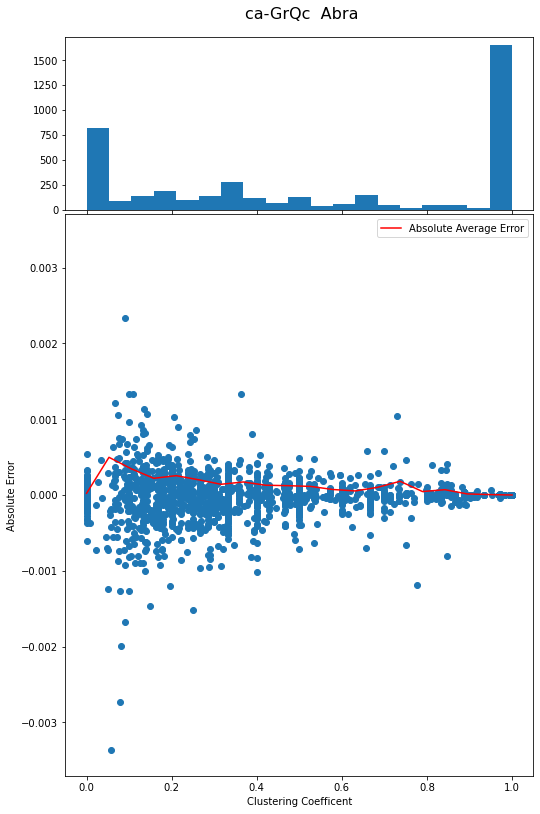

<Figure size 432x288 with 0 Axes>

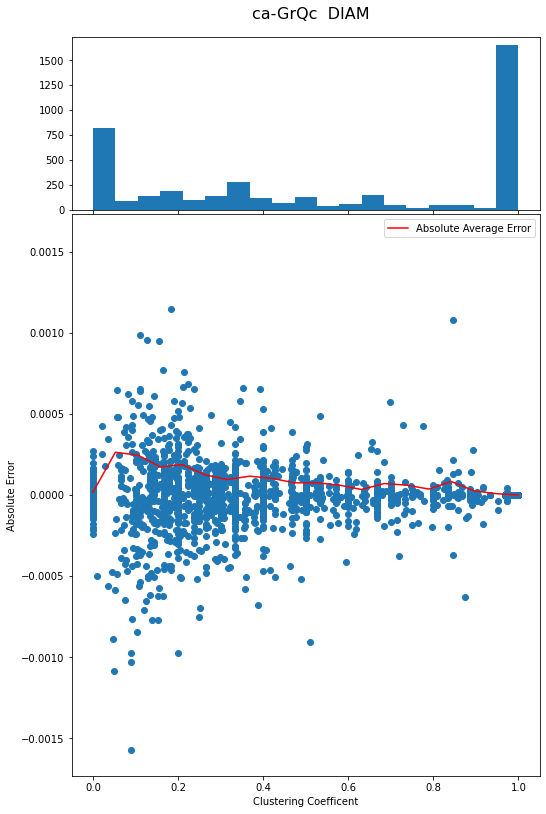

<Figure size 432x288 with 0 Axes>

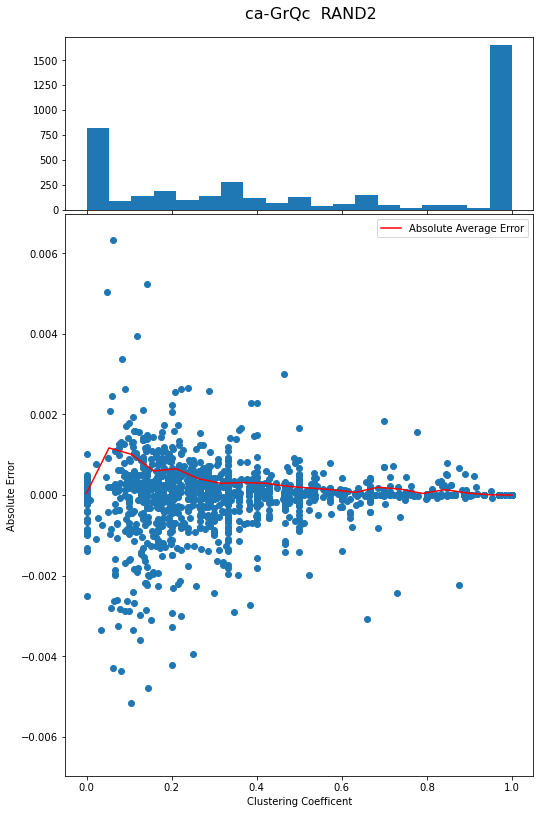

<Figure size 432x288 with 0 Axes>

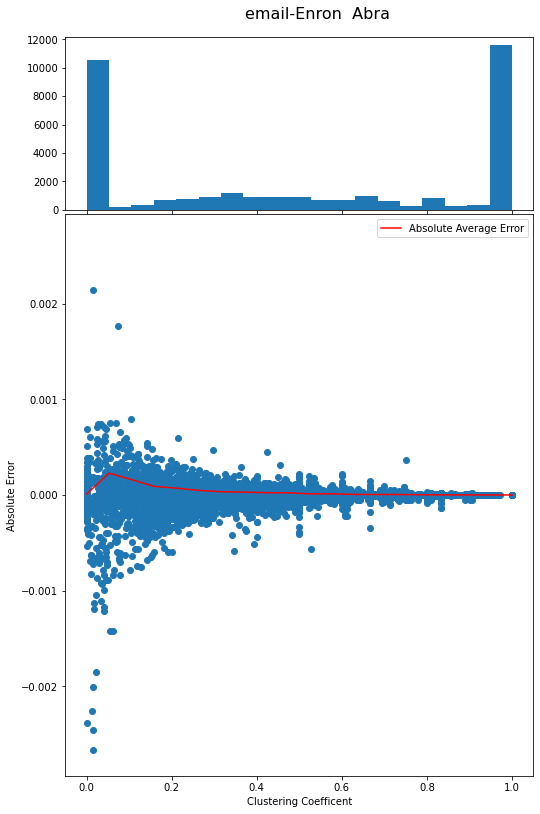

<Figure size 432x288 with 0 Axes>

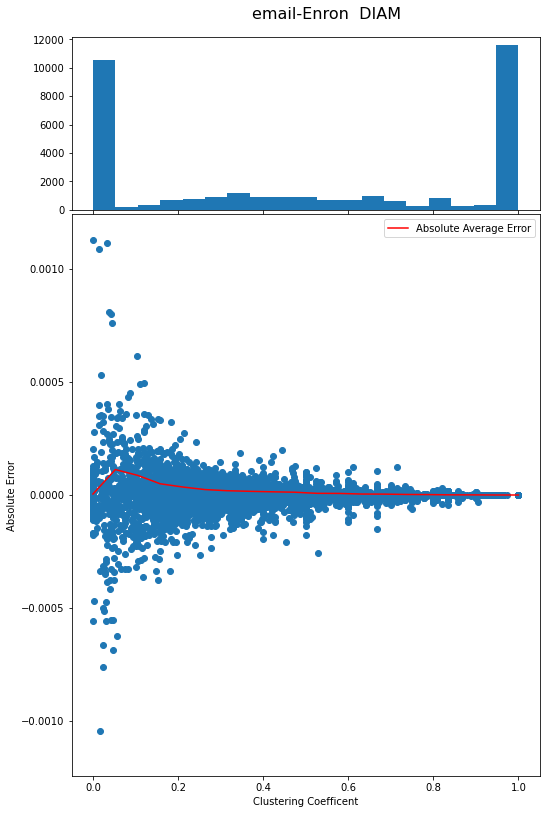

<Figure size 432x288 with 0 Axes>

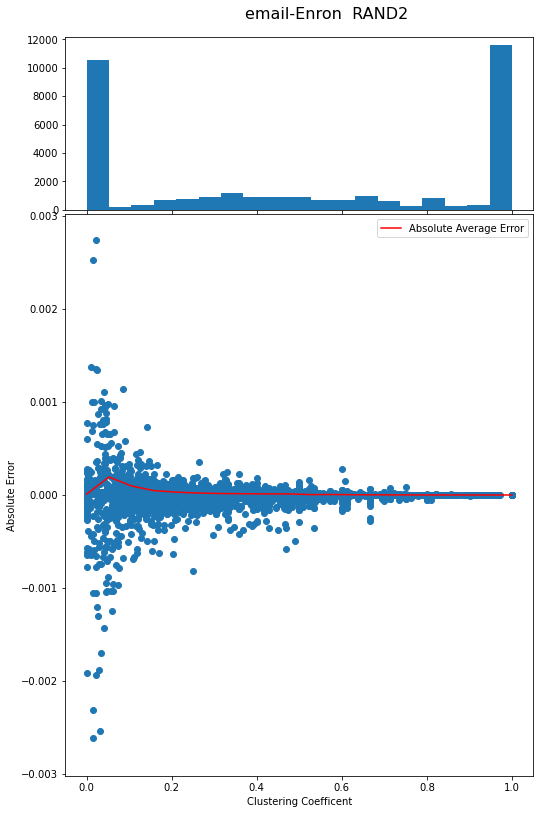

<Figure size 432x288 with 0 Axes>

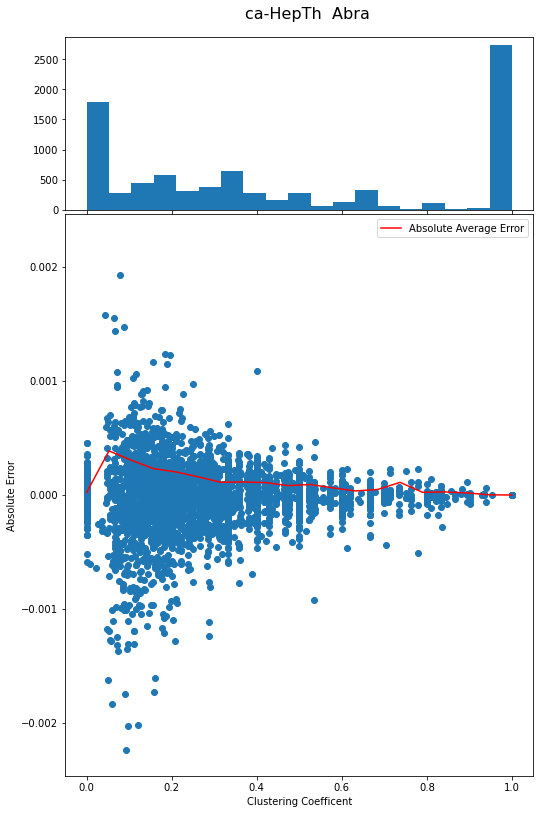

<Figure size 432x288 with 0 Axes>

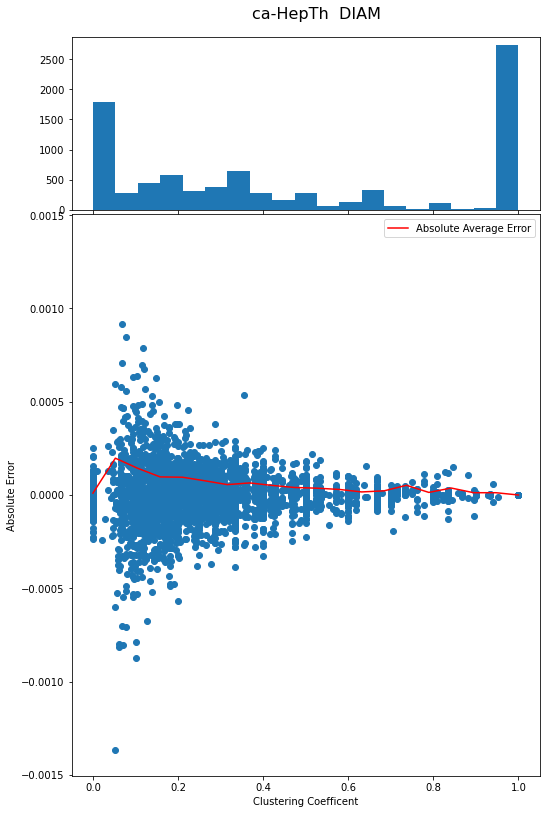

<Figure size 432x288 with 0 Axes>

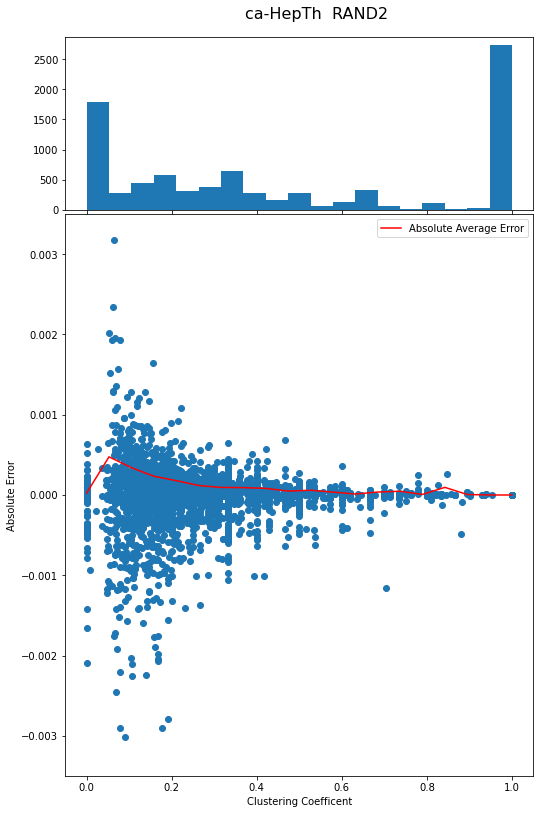

<Figure size 432x288 with 0 Axes>

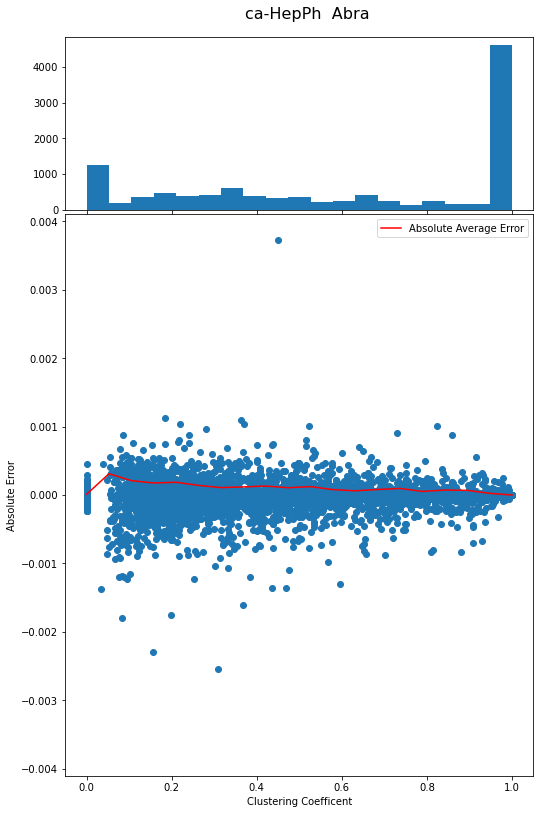

<Figure size 432x288 with 0 Axes>

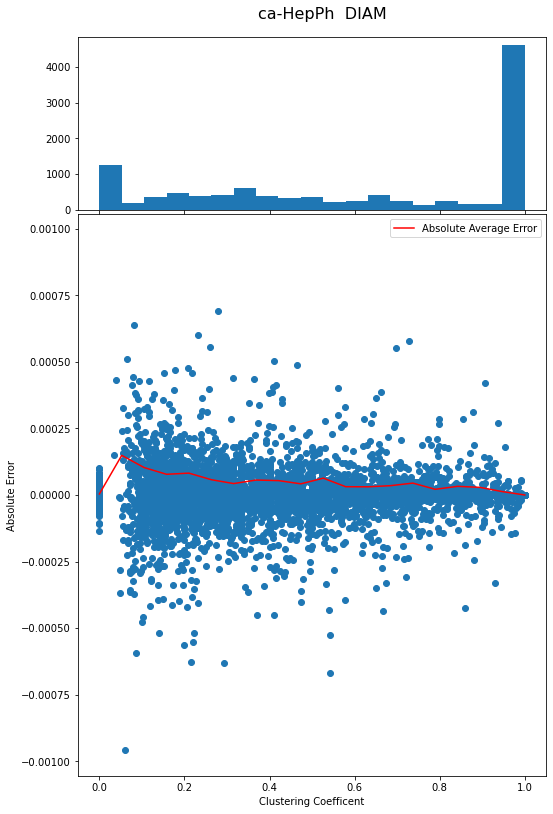

<Figure size 432x288 with 0 Axes>

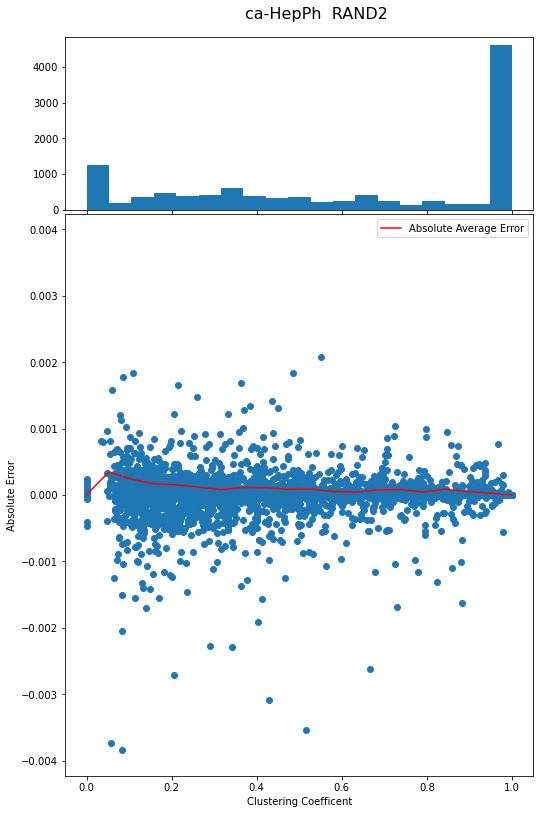

<Figure size 432x288 with 0 Axes>

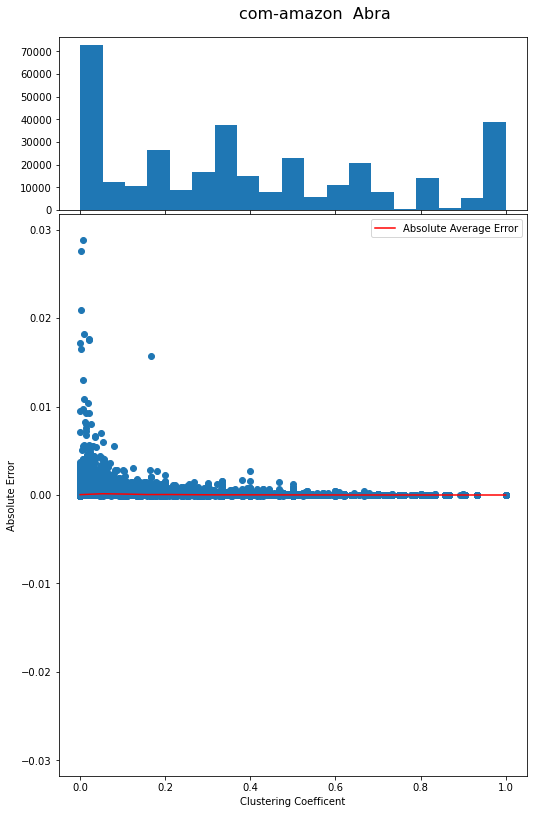

<Figure size 432x288 with 0 Axes>

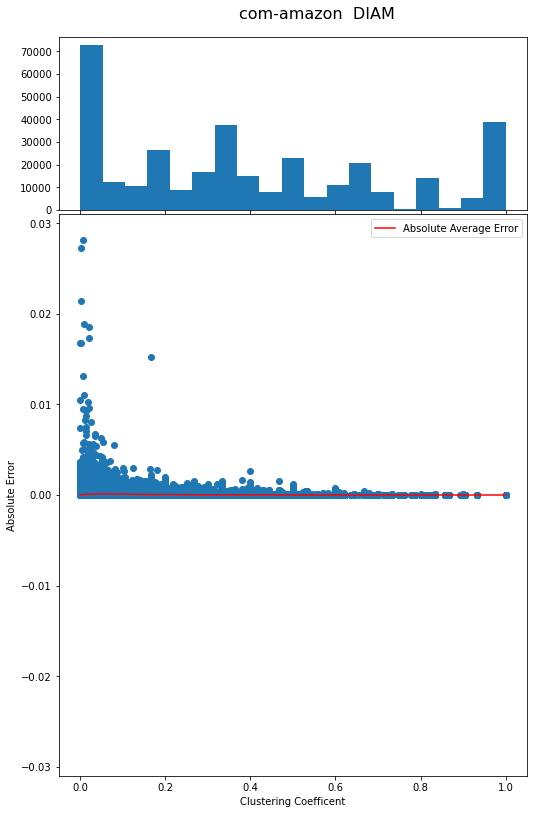

<Figure size 432x288 with 0 Axes>

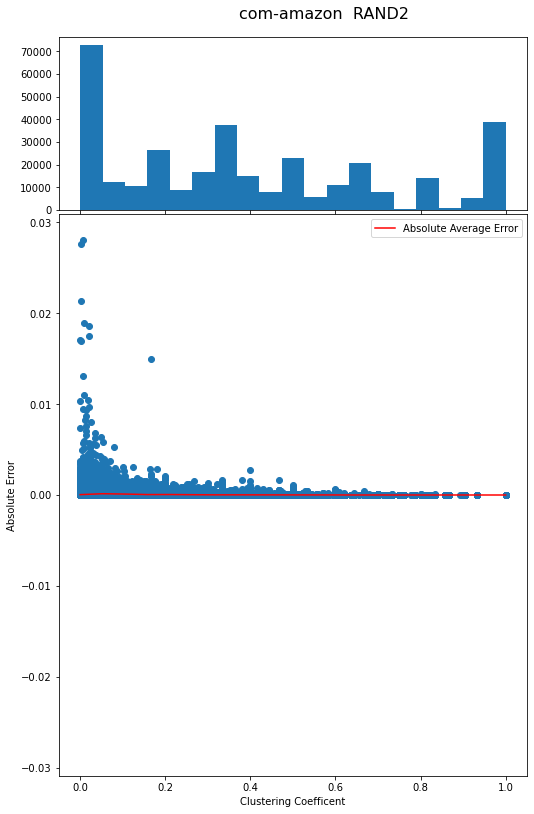

<Figure size 432x288 with 0 Axes>

In [4]:
def plot_error_clustering():   
    for graph in graphs:
        for method in methods:
            # Load error file
            error = IO.file_to_dict(f"{Path().absolute()}\\Errors\\Error_{graph}_{method}.txt")
            G = nx.read_edgelist(f'{Path().absolute()}\\Graphs/{graph}.lcc.net', nodetype=int)
            C = nx.clustering(G)
            # Plotting Clustering vs Error

            colors = ['r' if G.degree(a) == 0 else 'b' for a in C.keys()]

            all_clusterval = []
            all_errorval = []
            for node in G.nodes:
                all_clusterval.append(C[node])
                all_errorval.append(error[node]\exact[node])
                #all_errorval.append(error[node])


            # definitions for the axes
            left, width = 0.1, 0.65
            bottom, height = 0.1, 0.65
            spacing = 0.005


            rect_scatter = [left, bottom, width, height]
            rect_histx = [left, bottom + height + spacing, width, 0.2]

            fig = plt.figure(figsize=(10, 12))
            ax = fig.add_axes(rect_scatter)
            fig.suptitle(f"{graph}  {method}", fontsize=16, x=0.35, y=.99, horizontalalignment='left',)
            ax.set_xlabel('Clustering Coefficent')
            ax.set_ylabel('Absolute Error')
            ax_histx = fig.add_axes(rect_histx, sharex=ax)


            # use the previously defined function
            bins = binning(all_clusterval)
            scatter_hist(all_clusterval, all_errorval, ax, ax_histx, bins)
            y_av = movingaverage(all_clusterval, all_errorval, bins)
            #plt.plot(all_clusterval, all_errorval)
            ax.plot(bins, y_av, 'r', label='Absolute Average Error')
            ax.legend()
            plt.savefig(f'Plots\\Clustering\\Clustering-Error_{graph}_{method}.png')
            plt.show()
            plt.clf()
plot_error_clustering()    

81


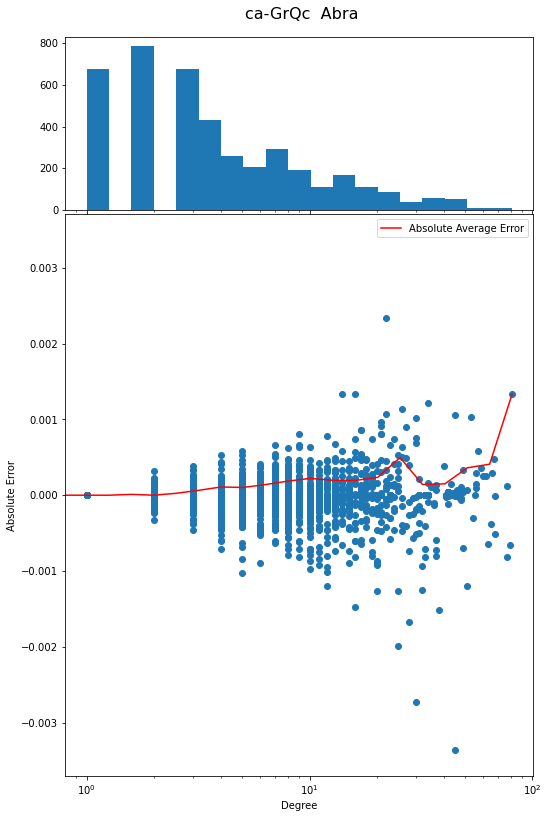

81


<Figure size 432x288 with 0 Axes>

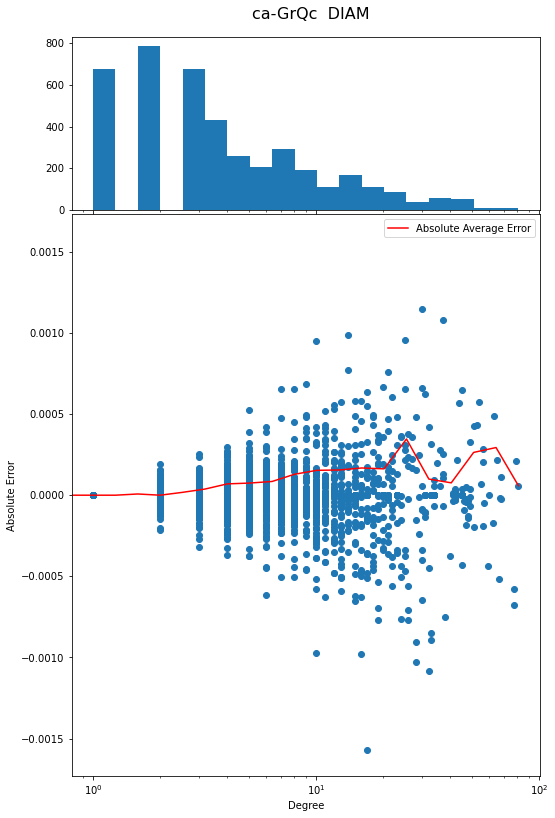

81


<Figure size 432x288 with 0 Axes>

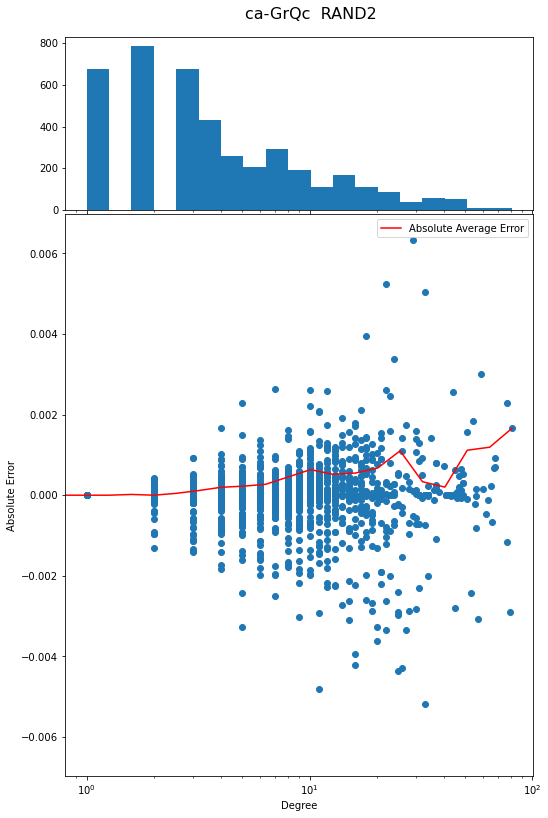

1383


<Figure size 432x288 with 0 Axes>

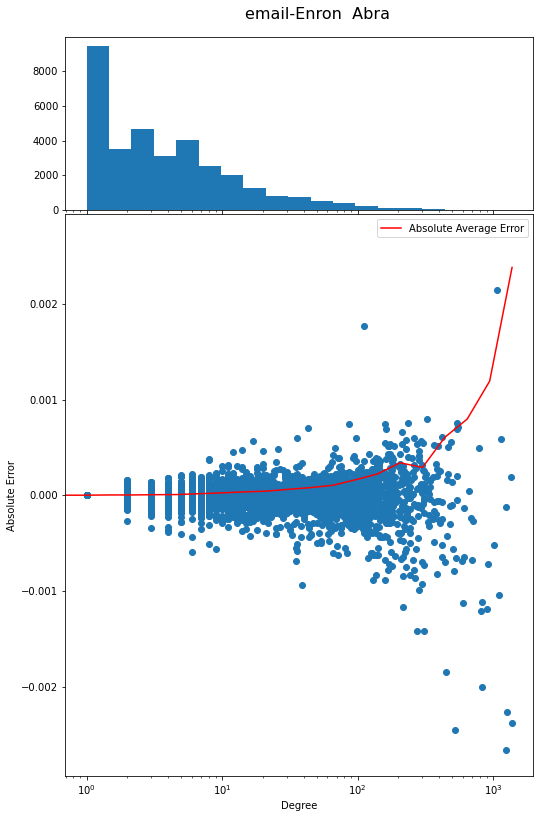

1383


<Figure size 432x288 with 0 Axes>

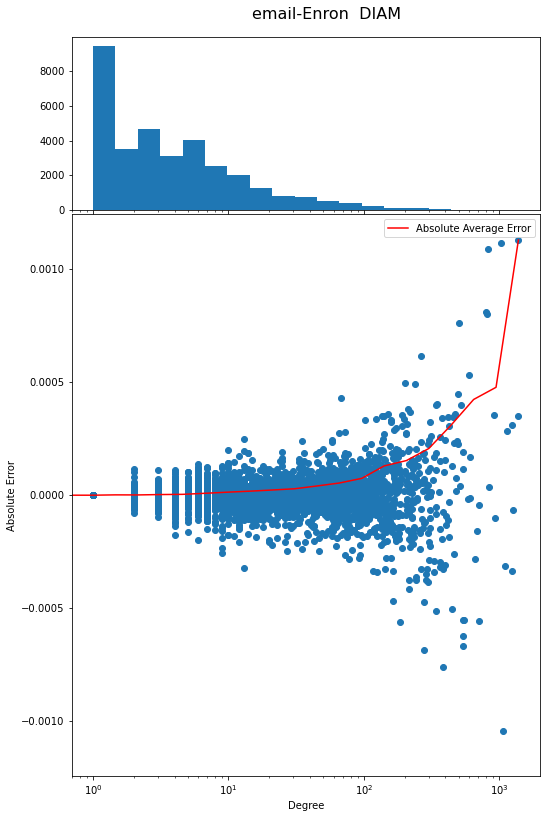

1383


<Figure size 432x288 with 0 Axes>

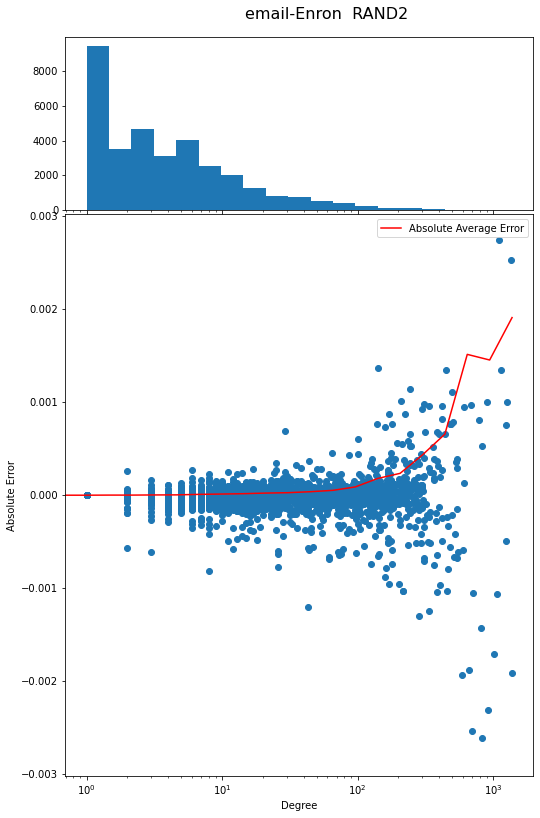

65


<Figure size 432x288 with 0 Axes>

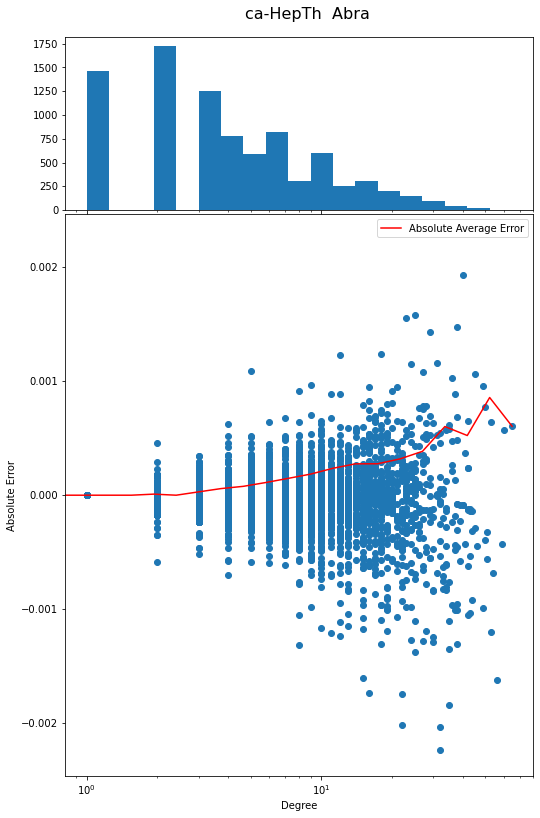

65


<Figure size 432x288 with 0 Axes>

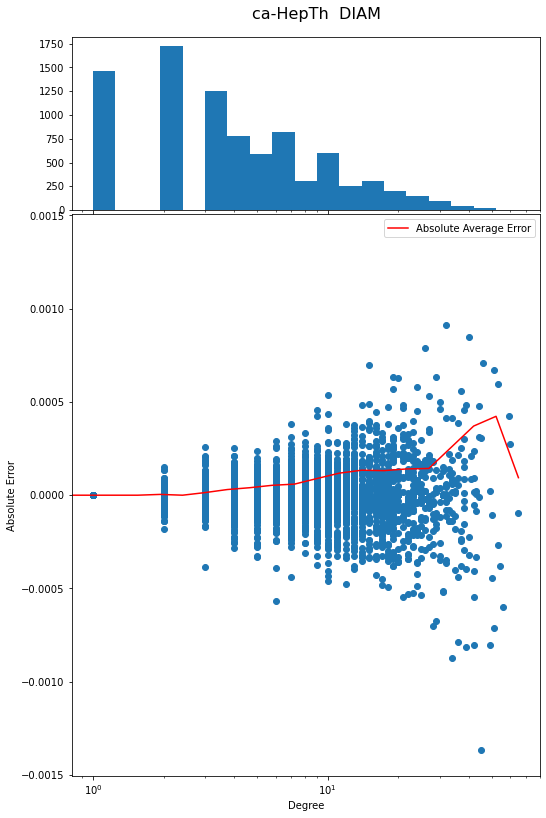

65


<Figure size 432x288 with 0 Axes>

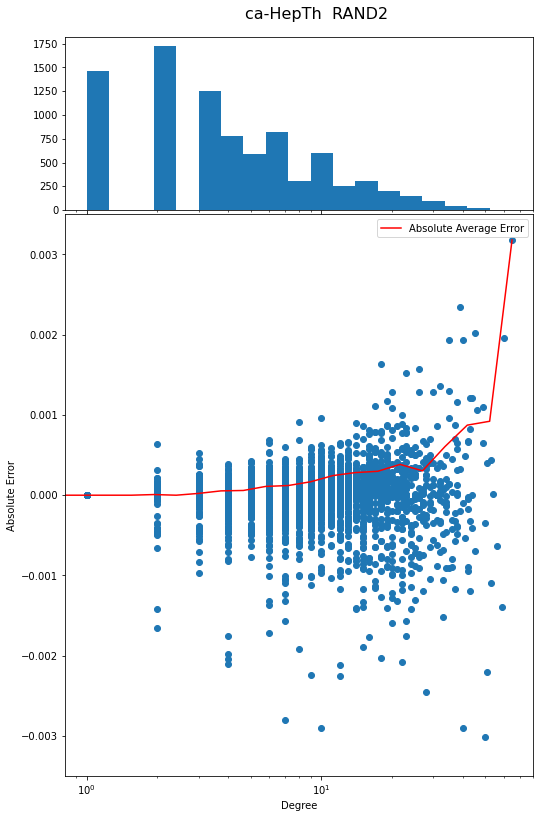

491


<Figure size 432x288 with 0 Axes>

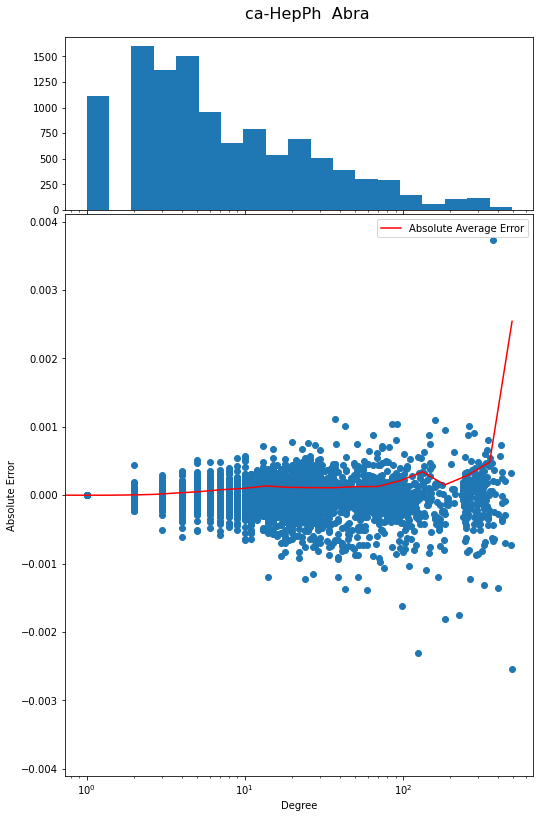

491


<Figure size 432x288 with 0 Axes>

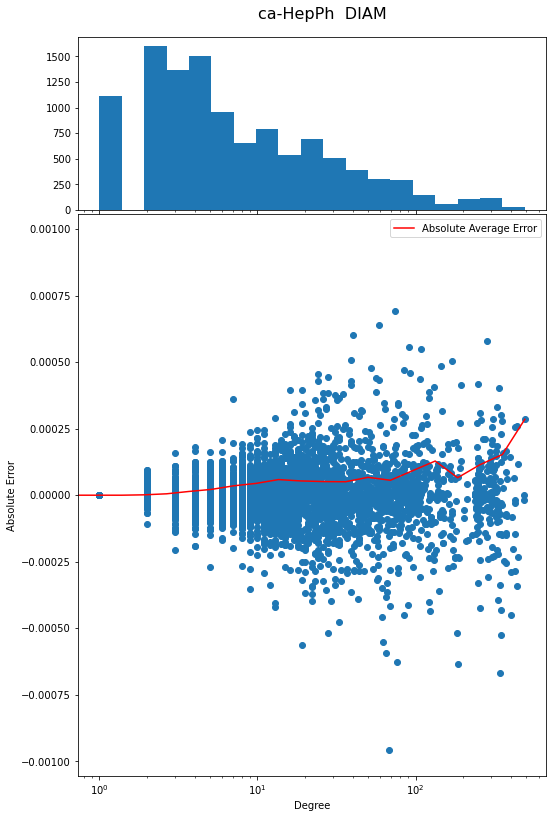

491


<Figure size 432x288 with 0 Axes>

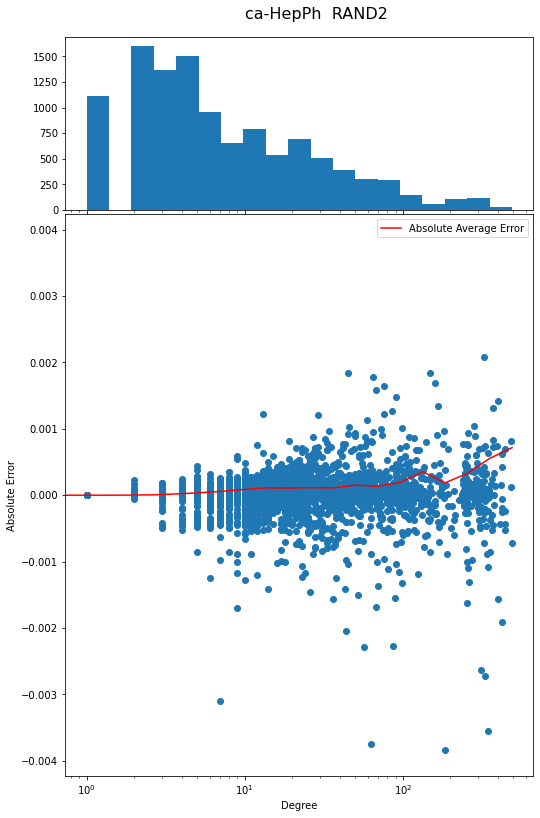

549


<Figure size 432x288 with 0 Axes>

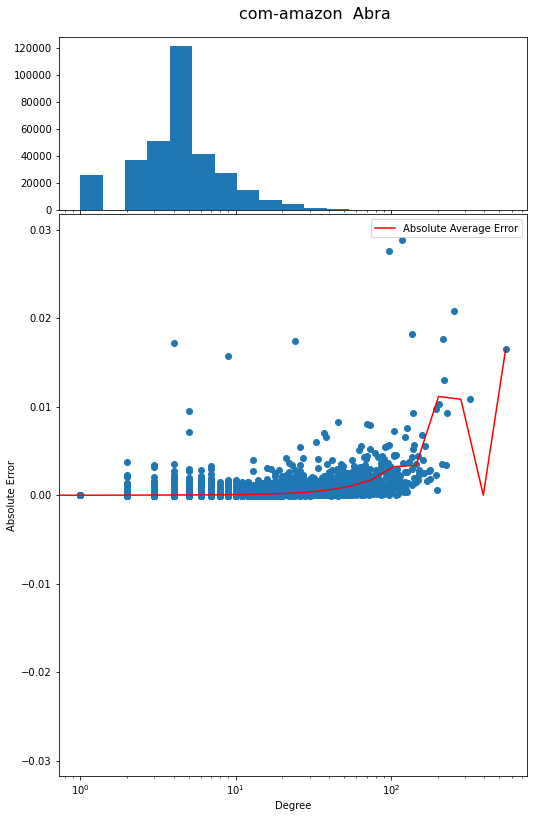

549


<Figure size 432x288 with 0 Axes>

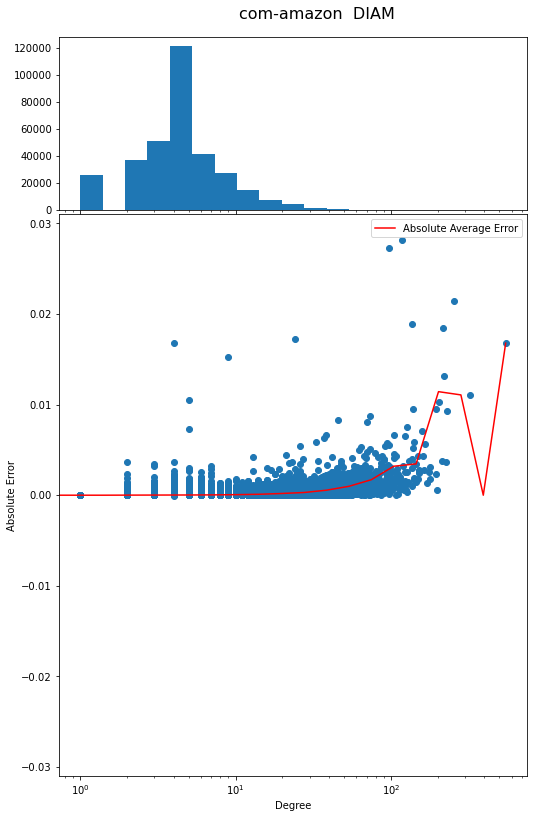

549


<Figure size 432x288 with 0 Axes>

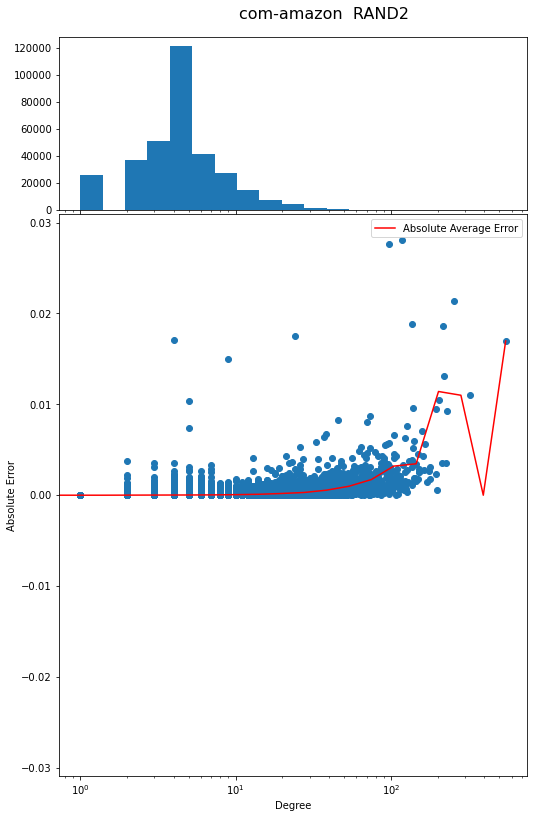

<Figure size 432x288 with 0 Axes>

In [5]:
def plot_error_degree():   
    for graph in graphs:
        for method in methods:
            # Load error file
            error = IO.file_to_dict(f"{Path().absolute()}\\Errors\\Error_{graph}_{method}.txt")
            G = nx.read_edgelist(f'{Path().absolute()}\\Graphs/{graph}.lcc.net', nodetype=int)
                        
            # Plotting Clustering vs Error

            all_degreeval = [G.degree[node] for node in range(len(list(G.nodes)))]
            all_errorval = [error[node] for node in range(len(list(G.nodes)))]
            
    #         plt.plot(all_clusterval, all_errorval,'o')

            # definitions for the axes
            left, width = 0.1, 0.65
            bottom, height = 0.1, 0.65
            spacing = 0.005


            rect_scatter = [left, bottom, width, height]
            rect_histx = [left, bottom + height + spacing, width, 0.2]

            fig = plt.figure(figsize=(10, 12))
            ax = fig.add_axes(rect_scatter)
            fig.suptitle(f"{graph}  {method}", fontsize=16, x=0.35, y=.99, horizontalalignment='left',)
            ax.set_xlabel('Degree')
            ax.set_ylabel('Absolute Error')
            ax_histx = fig.add_axes(rect_histx, sharex=ax)


            # use the previously defined function
            bins = binning(all_degreeval, linear=False)
            scatter_hist(all_degreeval, all_errorval, ax, ax_histx, bins)
            y_av = movingaverage(all_degreeval, all_errorval, bins)
            #plt.plot(all_clusterval, all_errorval)
            ax.plot(bins, y_av, 'r', label='Absolute Average Error')
            ax.legend()
            ax.set_xscale('log')
            plt.savefig(f'Plots\\Degree\\Degree-Error_{graph}_{method}_log.png')
            plt.show()
            plt.clf()
plot_error_degree()

81


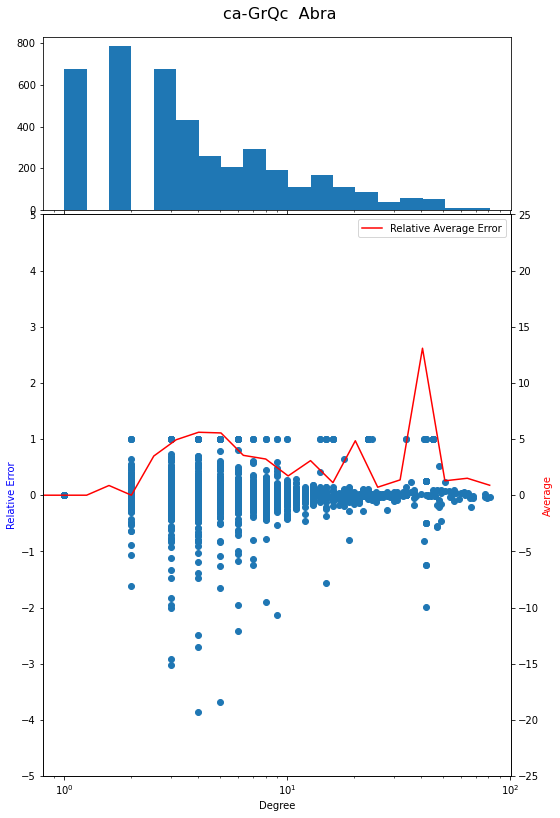

81


<Figure size 432x288 with 0 Axes>

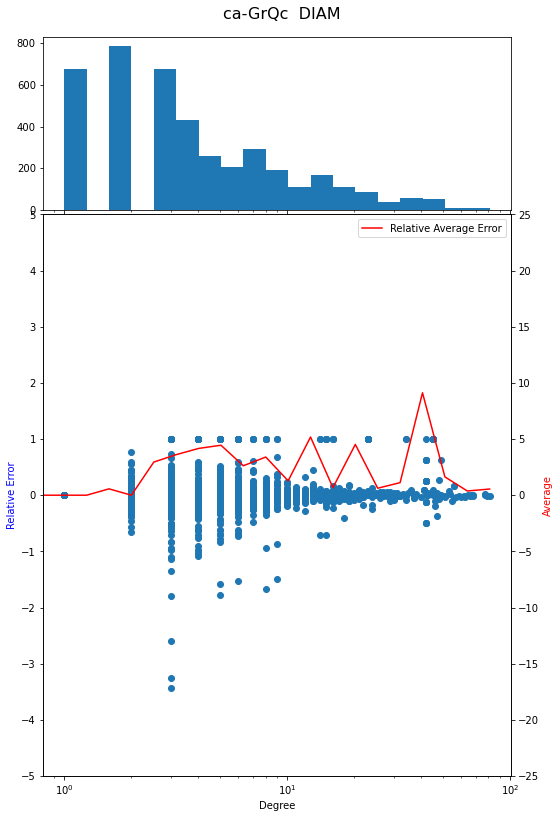

81


<Figure size 432x288 with 0 Axes>

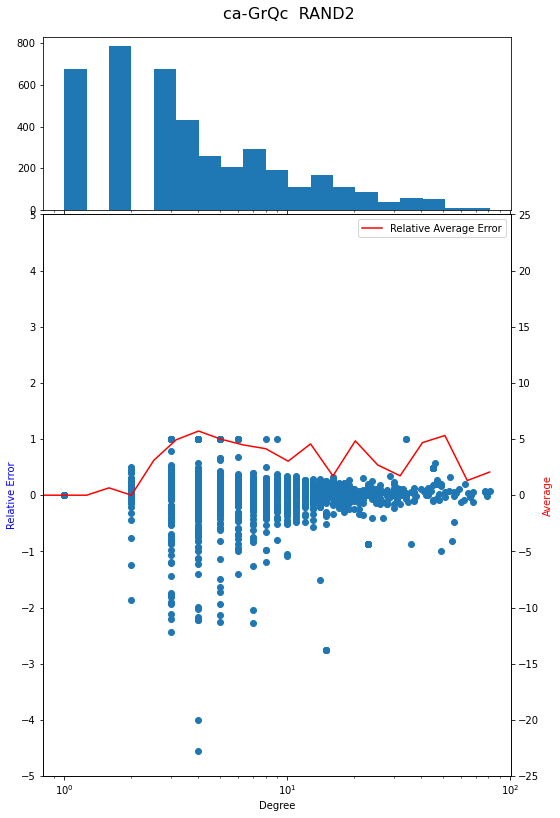

1383


<Figure size 432x288 with 0 Axes>

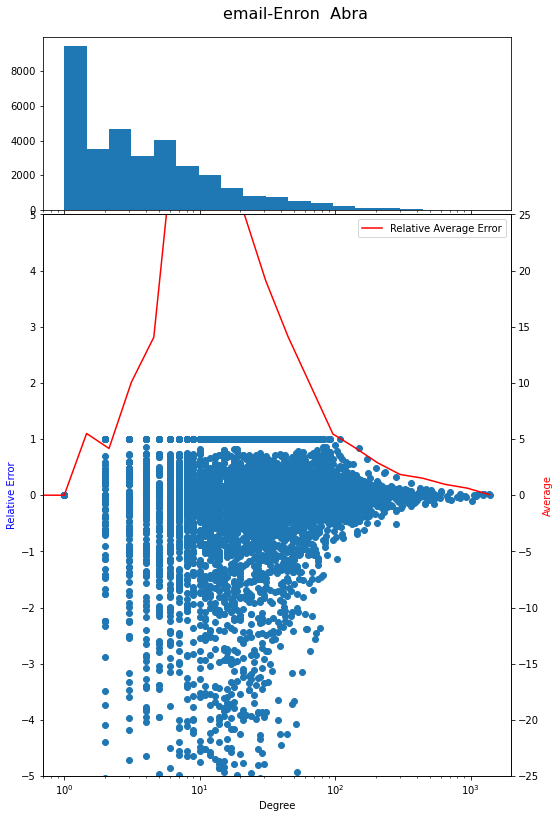

1383


<Figure size 432x288 with 0 Axes>

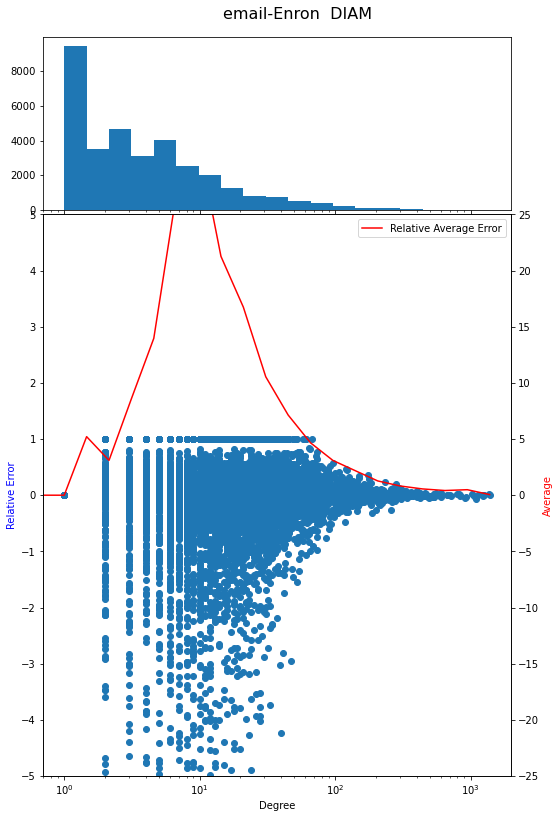

1383


<Figure size 432x288 with 0 Axes>

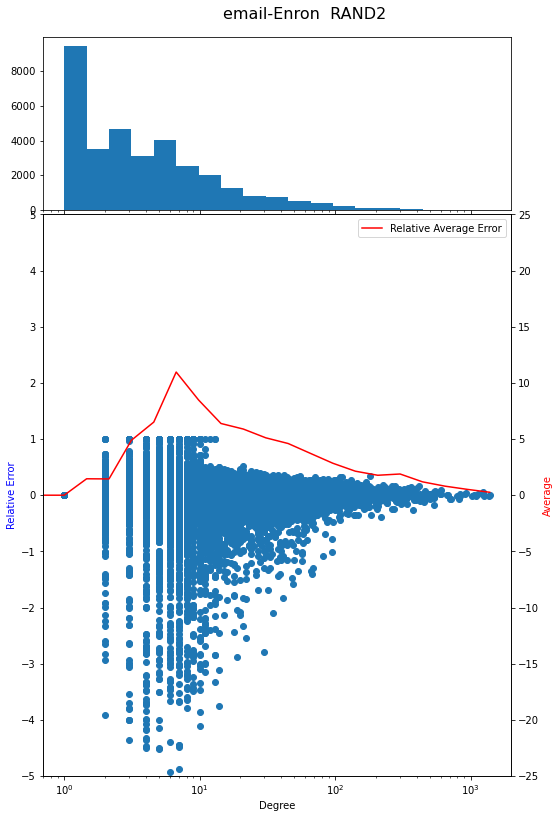

65


<Figure size 432x288 with 0 Axes>

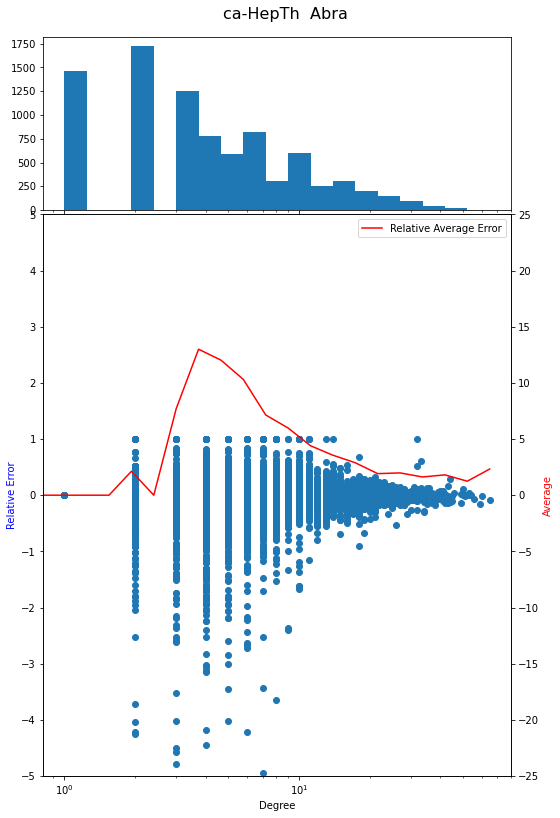

65


<Figure size 432x288 with 0 Axes>

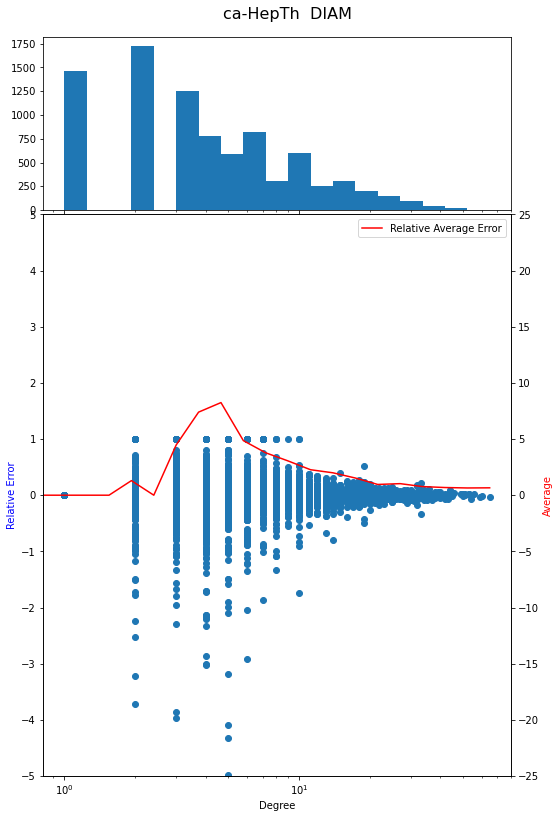

65


<Figure size 432x288 with 0 Axes>

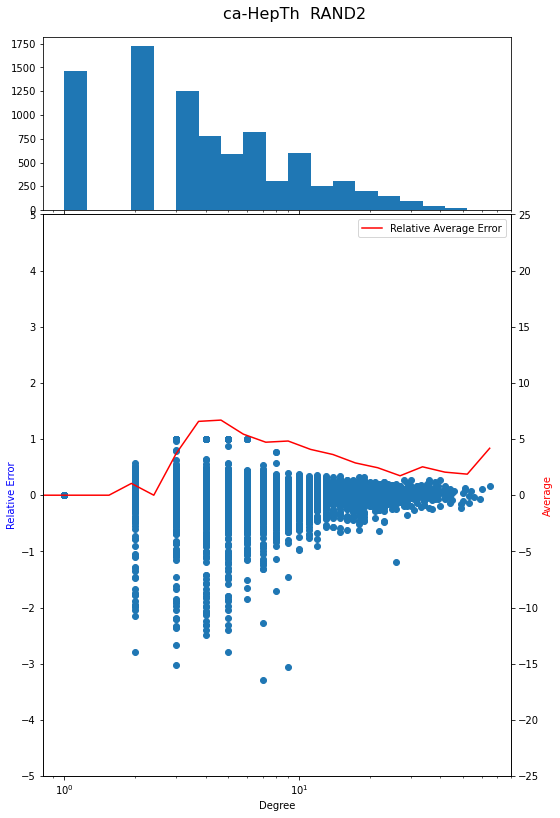

491


<Figure size 432x288 with 0 Axes>

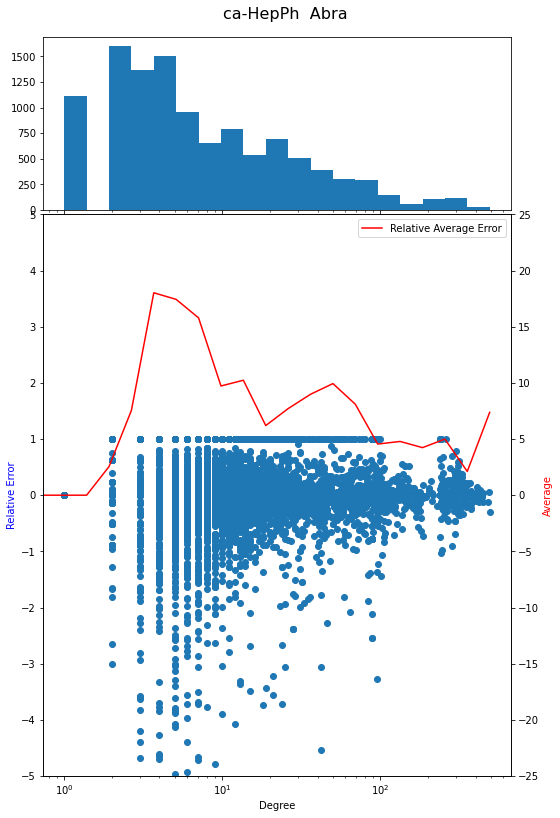

491


<Figure size 432x288 with 0 Axes>

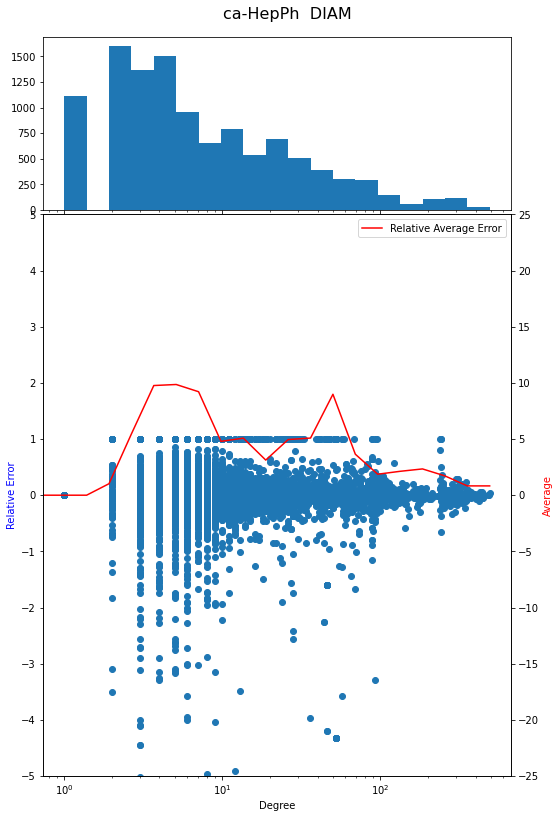

491


<Figure size 432x288 with 0 Axes>

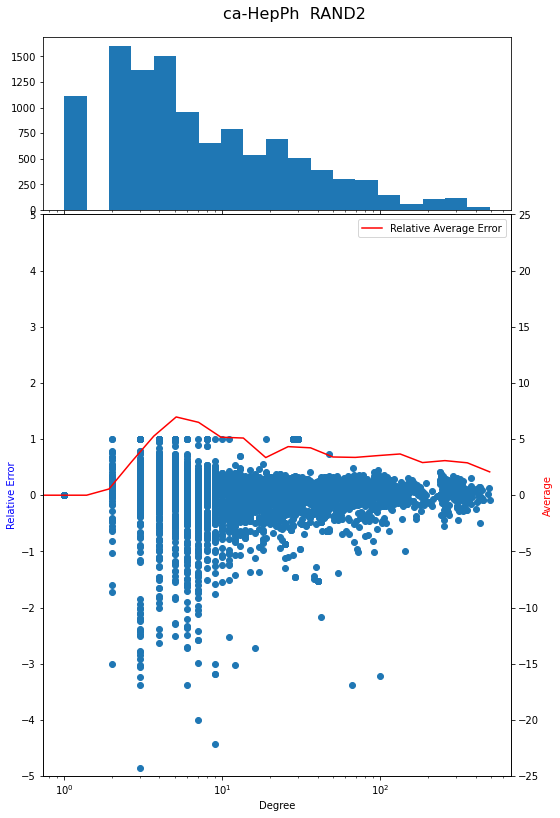

549


<Figure size 432x288 with 0 Axes>

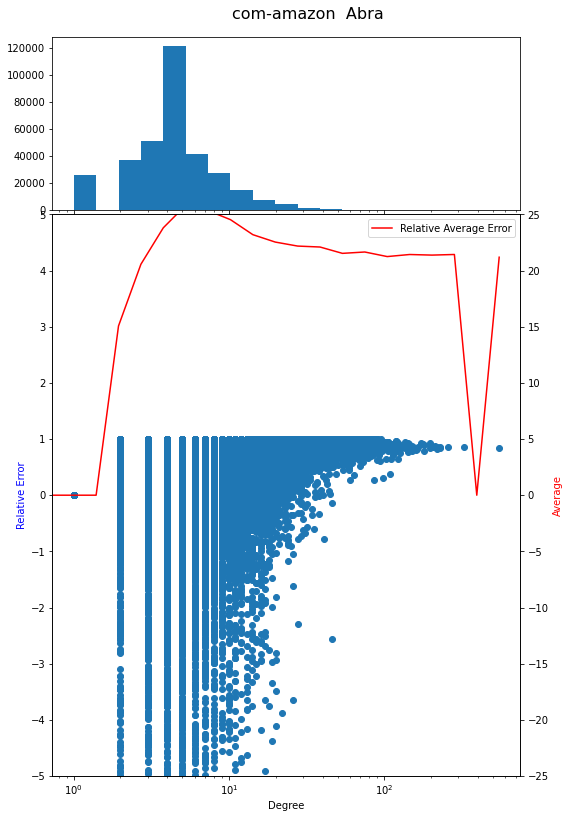

549


<Figure size 432x288 with 0 Axes>

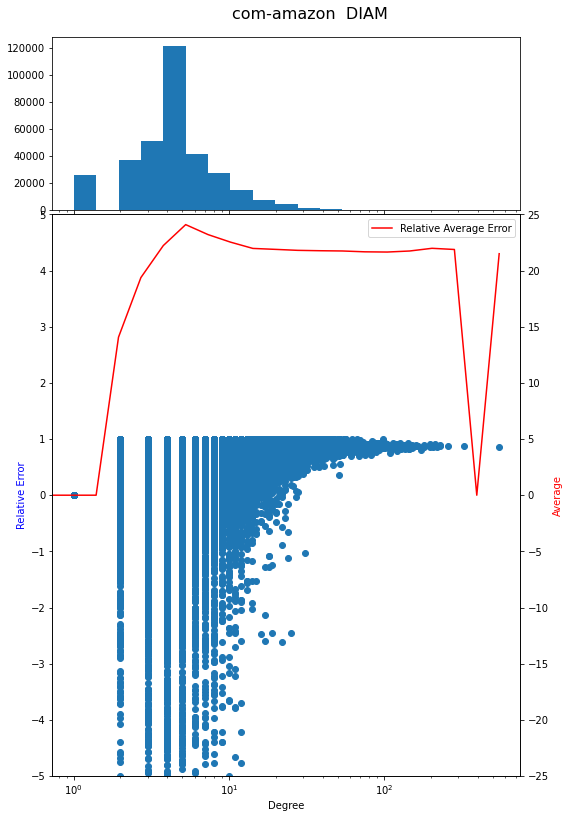

549


<Figure size 432x288 with 0 Axes>

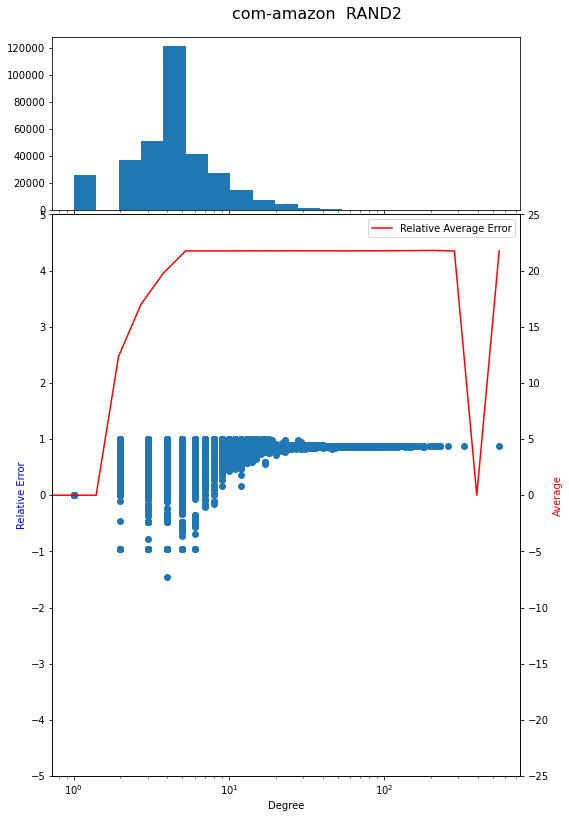

<Figure size 432x288 with 0 Axes>

In [23]:
def plot_error_degree_rel():   
    for graph in graphs:
        for method in methods:
            # Load error file
            error = IO.file_to_dict(f"{Path().absolute()}\\Errors\\Error_{graph}_{method}.txt")
            G = nx.read_edgelist(f'{Path().absolute()}\\Graphs/{graph}.lcc.net', nodetype=int)
            exact_path = "C:\\Users\\Daniel\\Desktop\\Master Project\\Exact_Betweenness\\Normalized_Scores"
            exact = IO.file_to_dict(f'{exact_path}\\{graph}.txt')
                        
            # Plotting Clustering vs Error

            all_degreeval = [G.degree[node] for node in G.nodes]
            all_errorval = [error[node]/exact[node] if exact[node] != 0 else 0 for node in G.nodes]
            
    #         plt.plot(all_clusterval, all_errorval,'o')

            # definitions for the axes
            left, width = 0.1, 0.65
            bottom, height = 0.1, 0.65
            spacing = 0.005
            Average_Error_Multiplier = 5


            rect_scatter = [left, bottom, width, height]
            rect_histx = [left, bottom + height + spacing, width, 0.2]

            fig = plt.figure(figsize=(10, 12))
            ax = fig.add_axes(rect_scatter)
            fig.suptitle(f"{graph}  {method}", fontsize=16, x=0.35, y=.99, horizontalalignment='left',)
            ax.set_xlabel('Degree')
            ax.set_ylabel('Relative Error', color='b')
            ax_histx = fig.add_axes(rect_histx, sharex=ax)


            # use the previously defined function
            bins = binning(all_degreeval, linear=False)
            scatter_hist(all_degreeval, all_errorval, ax, ax_histx, bins)
            y_av = movingaverage(all_degreeval, all_errorval, bins, mult=Average_Error_Multiplier)
            #plt.plot(all_clusterval, all_errorval)
            ax.plot(bins, y_av, 'r', label='Relative Average Error')
            ax.legend()
            ax.set_xscale('log')
            min_ylim, max_ylim = -5, 5
            ax.set_ylim([min_ylim, max_ylim])
            ax.set_yticks(np.arange(min_ylim, max_ylim+1, 1))
            ax2 = ax.twinx()
            ax2.set_yticks(np.arange(min_ylim*Average_Error_Multiplier, max_ylim*Average_Error_Multiplier+1, Average_Error_Multiplier))
            ax2.set_ylabel('Average', color='r')
            plt.savefig(f'Plots\\Degree\\relative\\Degree-Error_{graph}_{method}_relative_log.png')
            plt.show()
            plt.clf()
plot_error_degree_rel()

No handles with labels found to put in legend.


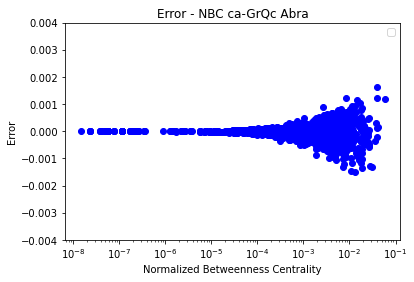

No handles with labels found to put in legend.


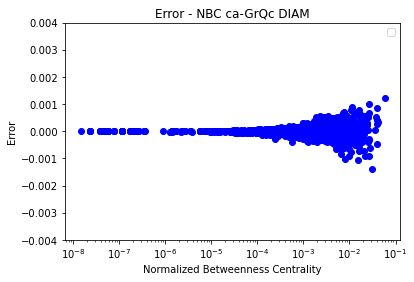

No handles with labels found to put in legend.


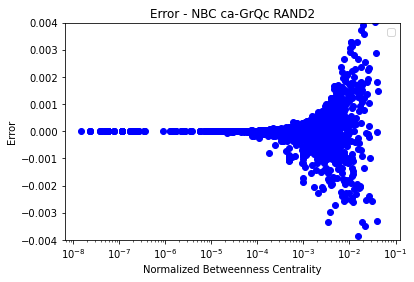

No handles with labels found to put in legend.


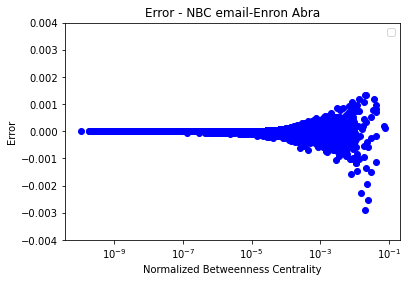

No handles with labels found to put in legend.


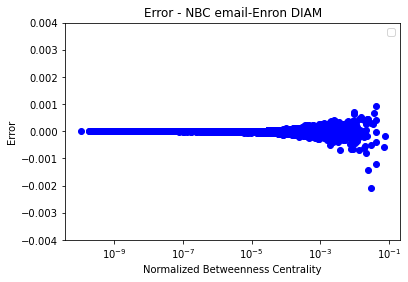

No handles with labels found to put in legend.


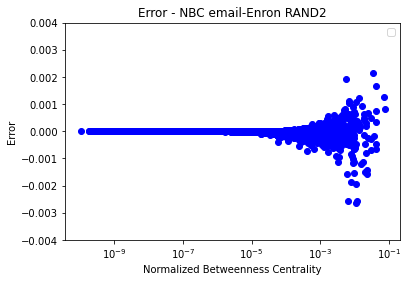

No handles with labels found to put in legend.


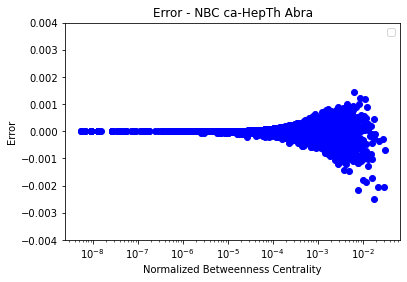

No handles with labels found to put in legend.


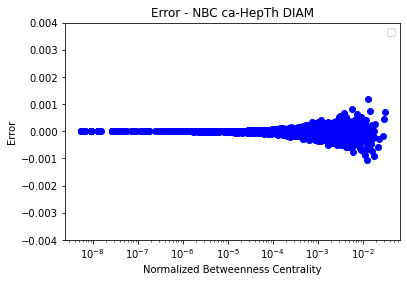

No handles with labels found to put in legend.


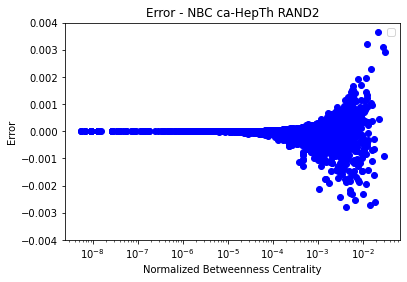

No handles with labels found to put in legend.


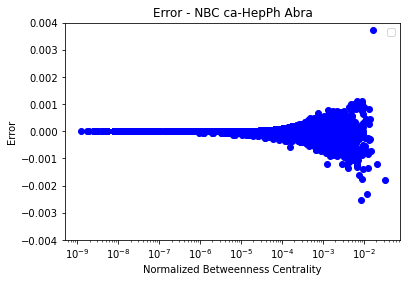

No handles with labels found to put in legend.


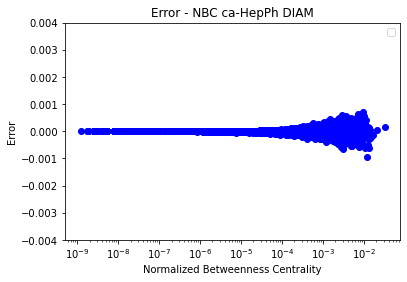

No handles with labels found to put in legend.


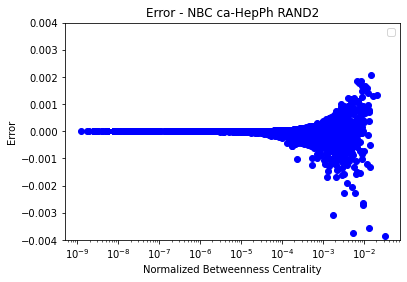

No handles with labels found to put in legend.


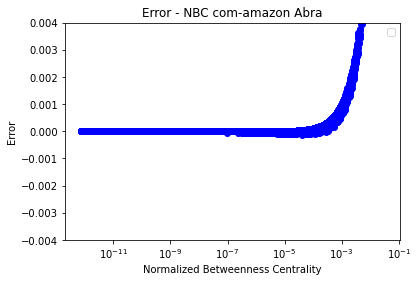

No handles with labels found to put in legend.


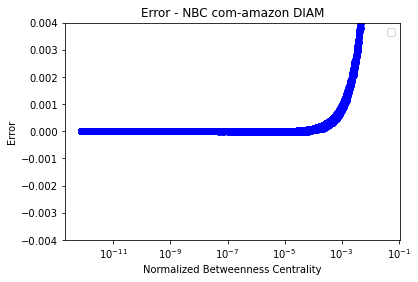

No handles with labels found to put in legend.


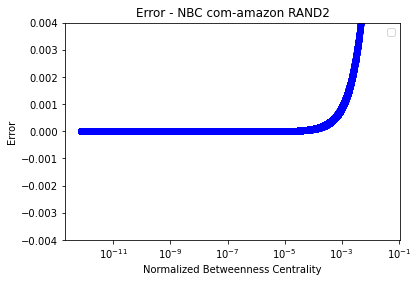

<Figure size 432x288 with 0 Axes>

In [16]:
def plot_error_bc():   
    for graph in graphs:
        for method in methods:
            # Load error file
            error = IO.file_to_dict(f"{Path().absolute()}\\Errors\\Error_{graph}_{method}.txt")
            G = nx.read_edgelist(f'{Path().absolute()}\\Graphs/{graph}.lcc.net', nodetype=int)
            exact_path = "C:\\Users\\Daniel\\Desktop\\Master Project\\Exact_Betweenness\\Normalized_Scores"
            exact = IO.file_to_dict(f'{exact_path}\\{graph}.txt')
            
                        
            # Plotting Clustering vs Error

            all_bcval = [exact[node] for node in G.nodes]
            all_errorval = [error[node] for node in G.nodes]
            
            plt.title(f'Error - NBC {graph} {method}')
            plt.plot(all_bcval, all_errorval, 'bo')
            plt.xscale('log')
            plt.legend()
            plt.ylim([-0.004, 0.004])
            plt.xlabel('Normalized Betweenness Centrality')
            plt.ylabel('Error')
            plt.savefig(f'Plots\\Betweenness Centrality\\Absolute Error\\BC-Error_{graph}_{method}.png')
            plt.show()
            plt.clf()
plot_error_bc()

No handles with labels found to put in legend.


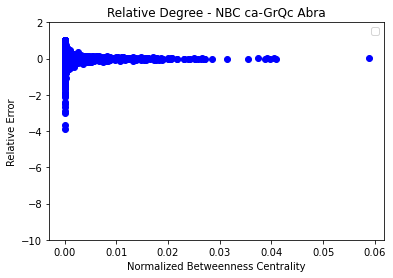

No handles with labels found to put in legend.


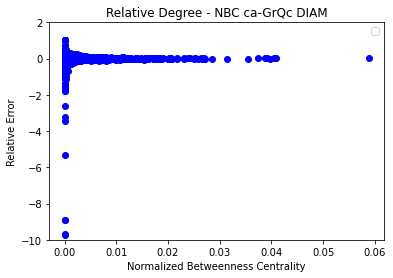

No handles with labels found to put in legend.


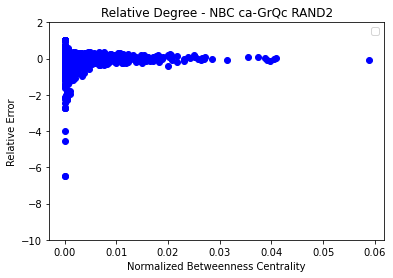

No handles with labels found to put in legend.


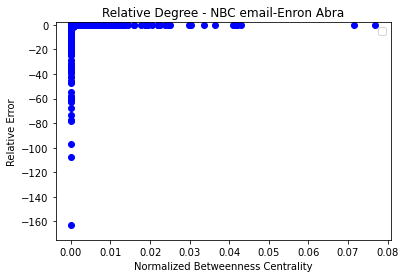

No handles with labels found to put in legend.


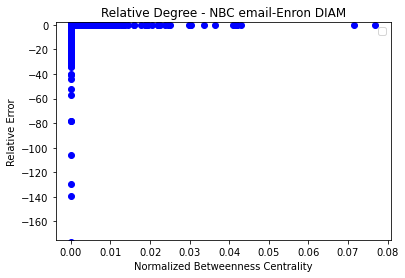

No handles with labels found to put in legend.


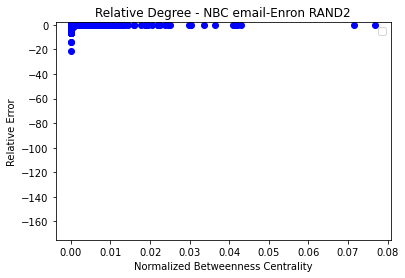

No handles with labels found to put in legend.


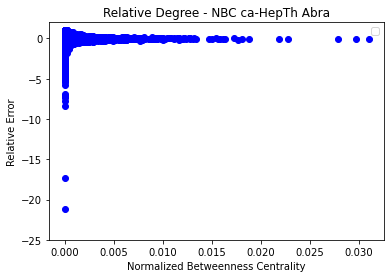

No handles with labels found to put in legend.


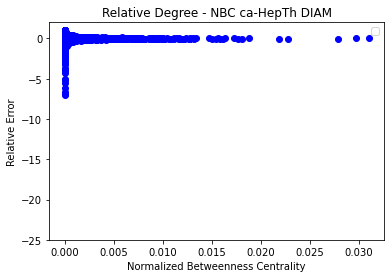

No handles with labels found to put in legend.


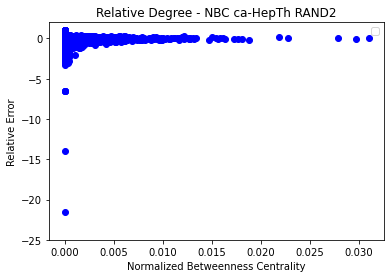

No handles with labels found to put in legend.


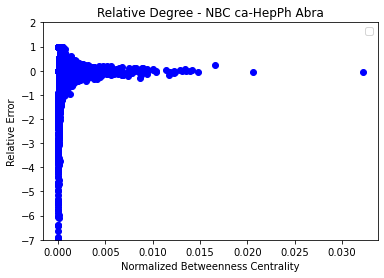

No handles with labels found to put in legend.


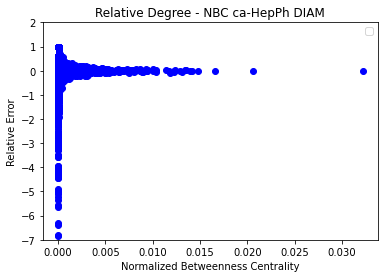

No handles with labels found to put in legend.


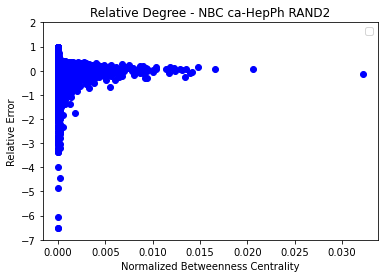

No handles with labels found to put in legend.


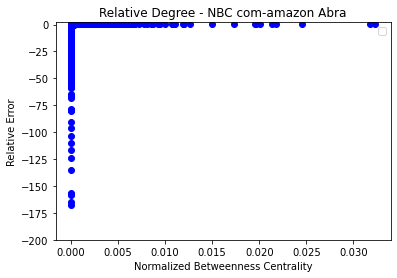

No handles with labels found to put in legend.


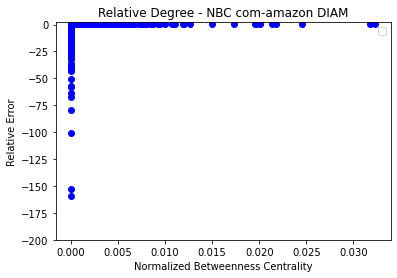

No handles with labels found to put in legend.


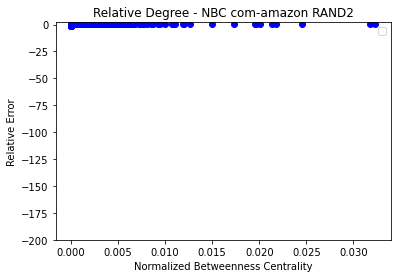

<Figure size 432x288 with 0 Axes>

In [6]:
def plot_relerror_bc():   
    # Limits for Graphs
    #["ca-GrQc", "email-Enron", "ca-HepTh", "ca-HepPh", "com-amazon"]
    upper_limit = [2, 2, 2, 2, 2]
    lower_limit = [-10, -175, -25, -7, -200]
    for index, graph in enumerate(graphs):
        for method in methods:
            # Load error file
            error = IO.file_to_dict(f"{Path().absolute()}\\Errors\\Error_{graph}_{method}.txt")
            G = nx.read_edgelist(f'{Path().absolute()}\\Graphs/{graph}.lcc.net', nodetype=int)
            exact_path = "C:\\Users\\Daniel\\Desktop\\Master Project\\Exact_Betweenness\\Normalized_Scores"
            exact = IO.file_to_dict(f'{exact_path}\\{graph}.txt')
            
                        
            # Plotting Clustering vs Error

            all_bcval = [exact[node] for node in G.nodes]
            all_errorval = [error[node]/exact[node] if exact[node] != 0 else 0 for node in G.nodes]
            # Limits for different Graphs
            plt.title(f'Relative Error - NBC {graph} {method}')
            plt.plot(all_bcval, all_errorval, 'bo')
            plt.xscale('log')
            plt.legend()
            plt.ylim([lower_limit[index], upper_limit[index]])
            plt.xlabel('Normalized Betweenness Centrality')
            plt.ylabel('Relative Error')
            plt.savefig(f'Plots\\Betweenness Centrality\\Relative Error\\BC-Rel_Error_{graph}_{method}_log.png')
            plt.show()
            plt.clf()
plot_relerror_bc()

No handles with labels found to put in legend.


<class 'list'> 4158


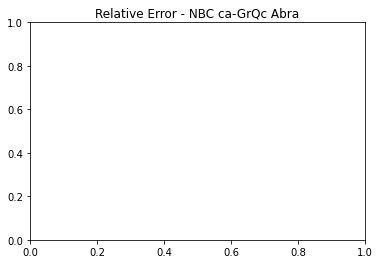

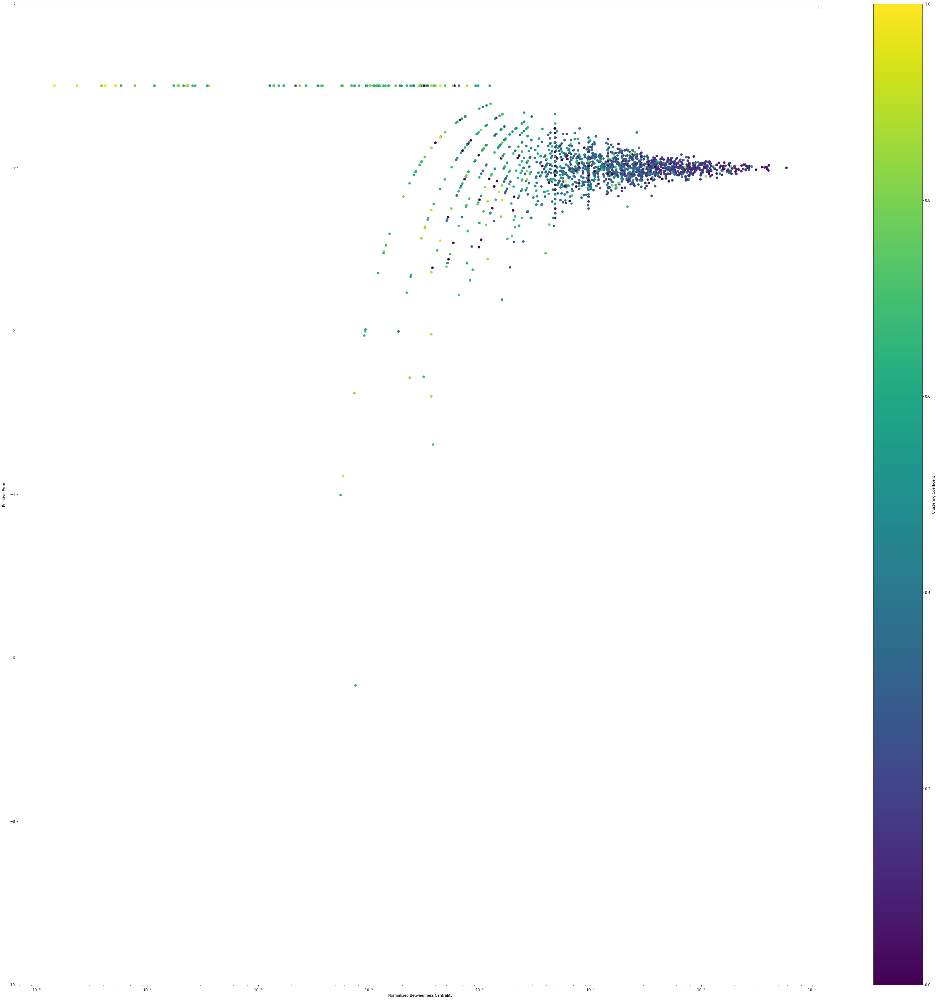

No handles with labels found to put in legend.


<class 'list'> 4158


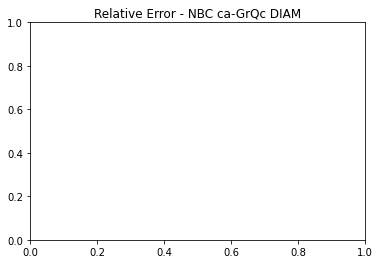

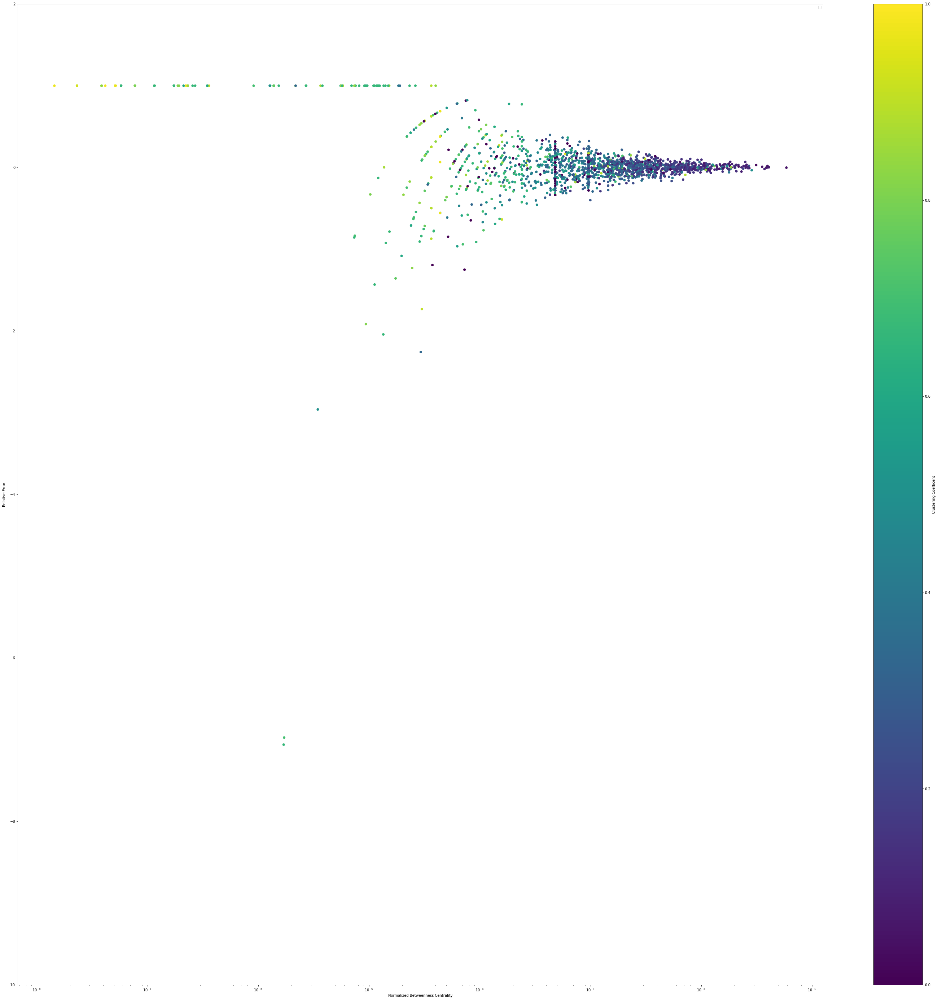

No handles with labels found to put in legend.


<class 'list'> 4158


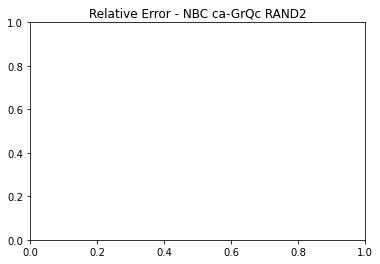

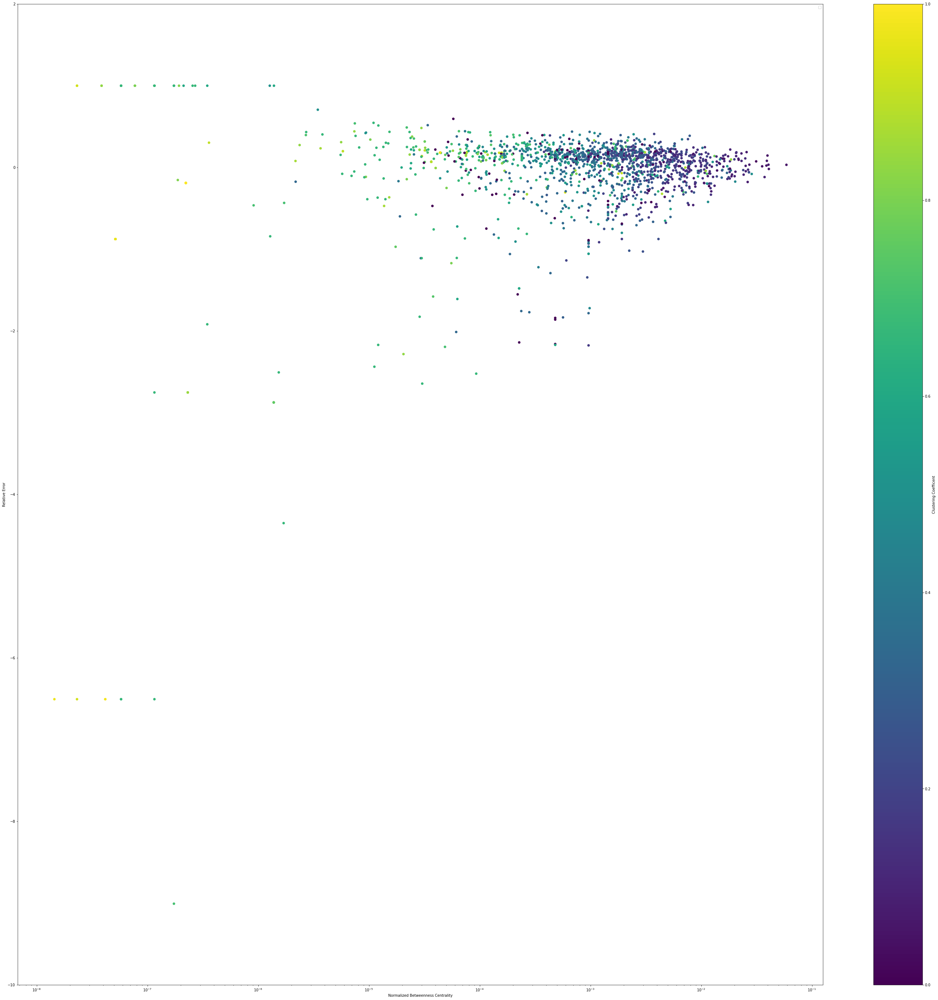

<class 'list'> 33696


No handles with labels found to put in legend.


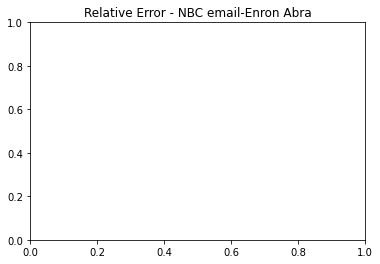

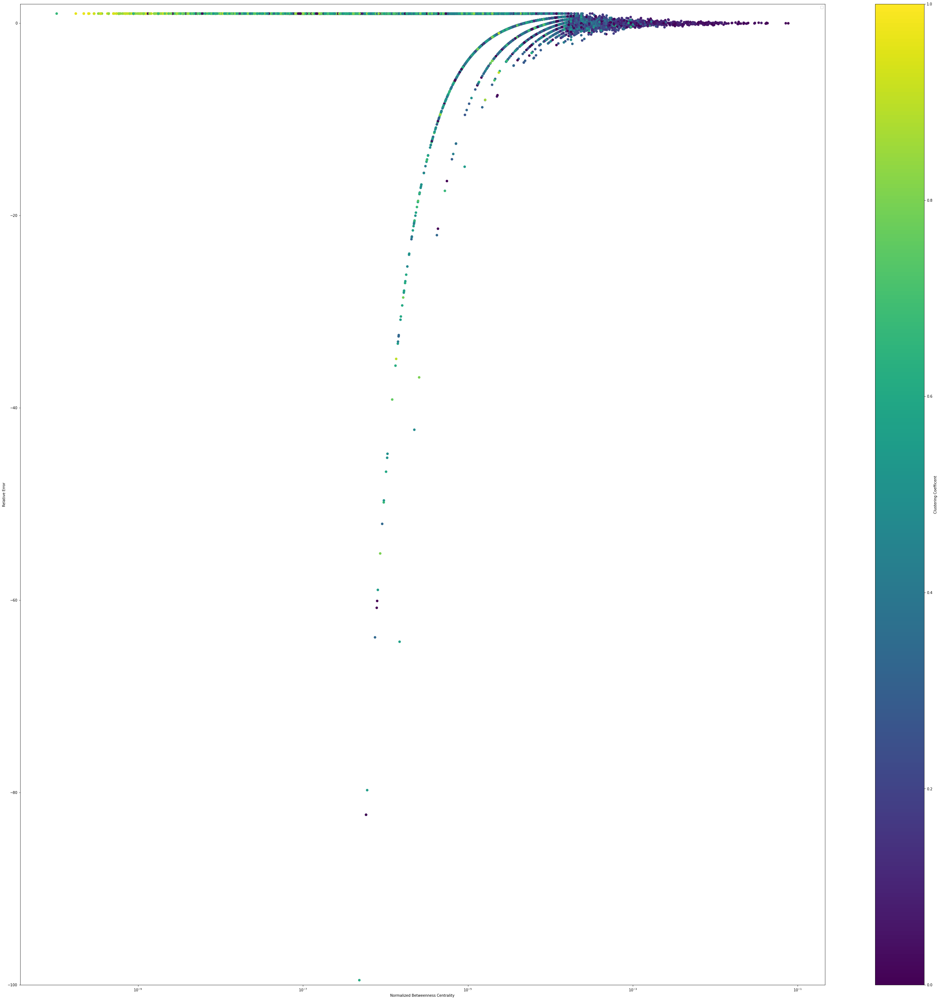

<class 'list'> 33696


No handles with labels found to put in legend.


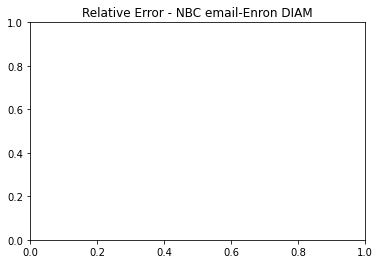

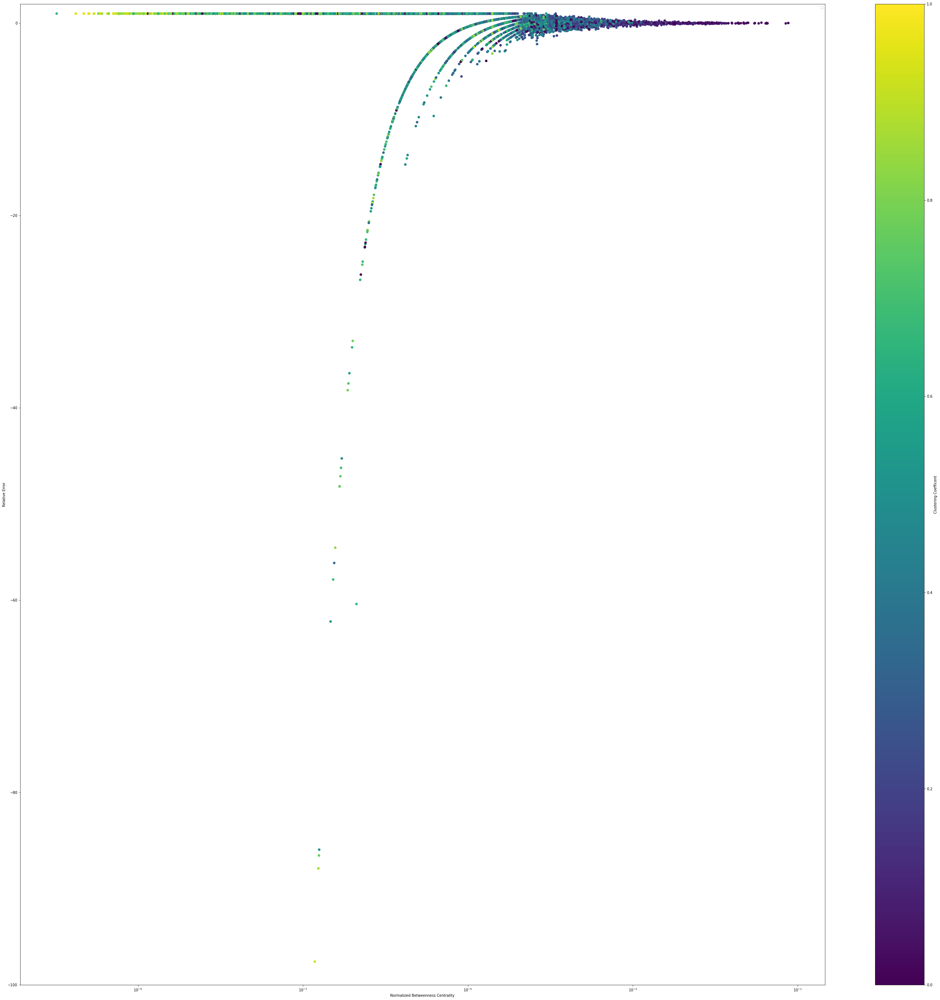

<class 'list'> 33696


No handles with labels found to put in legend.


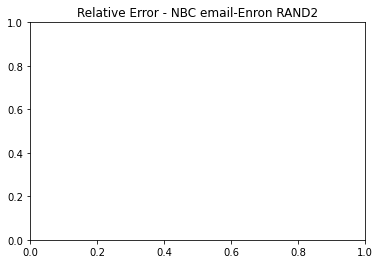

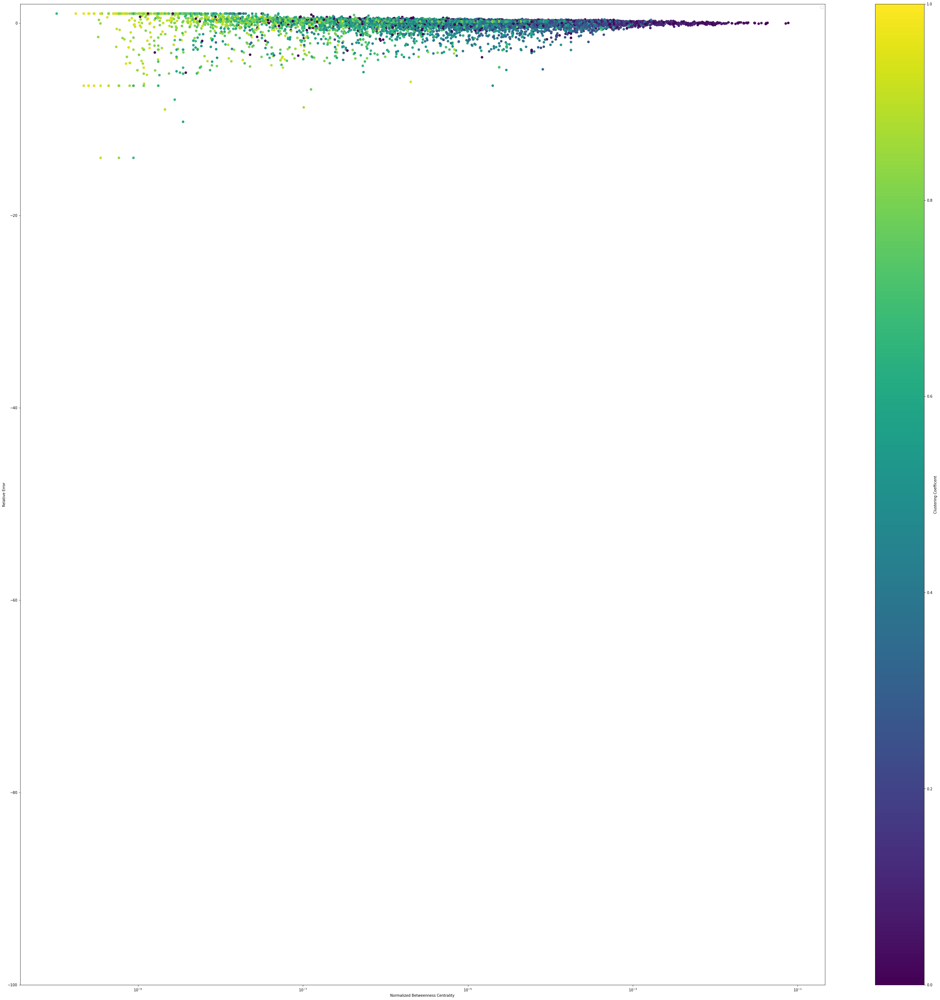

No handles with labels found to put in legend.


<class 'list'> 8638


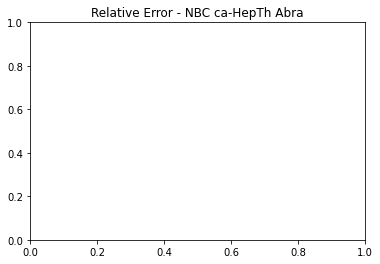

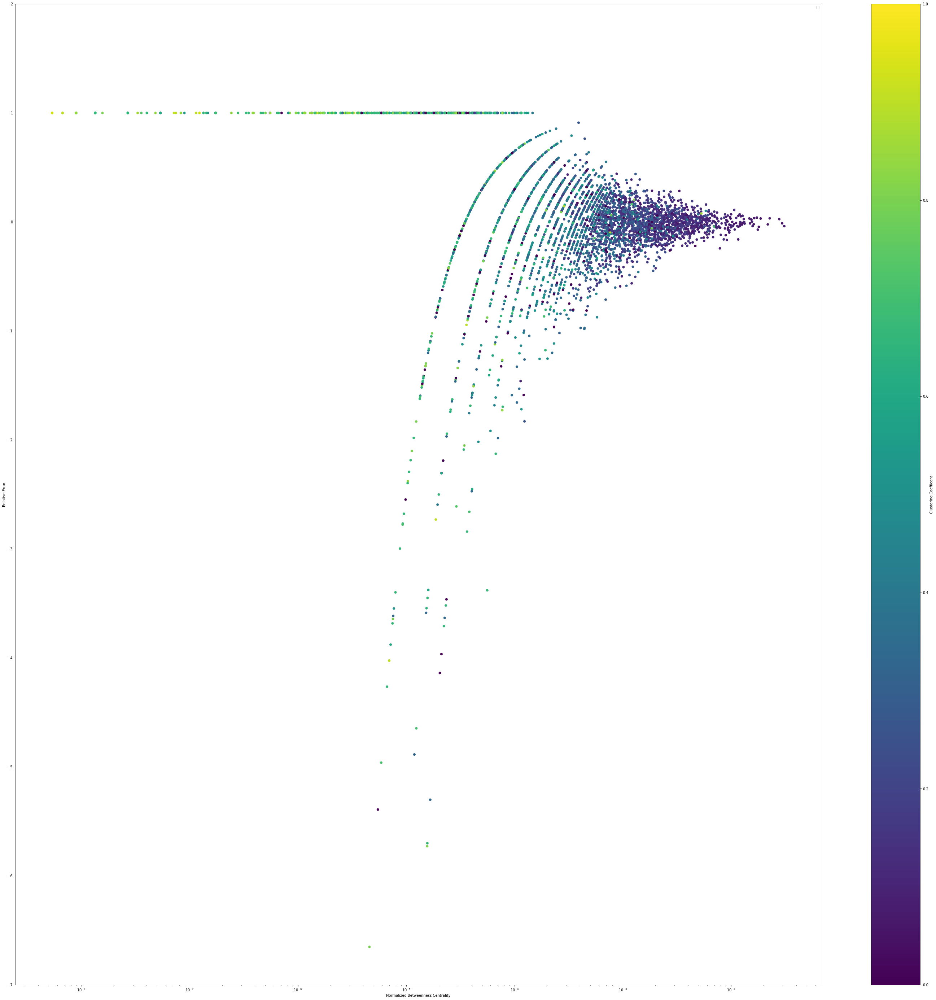

No handles with labels found to put in legend.


<class 'list'> 8638


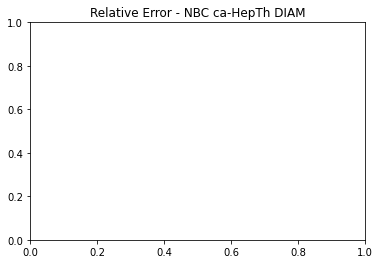

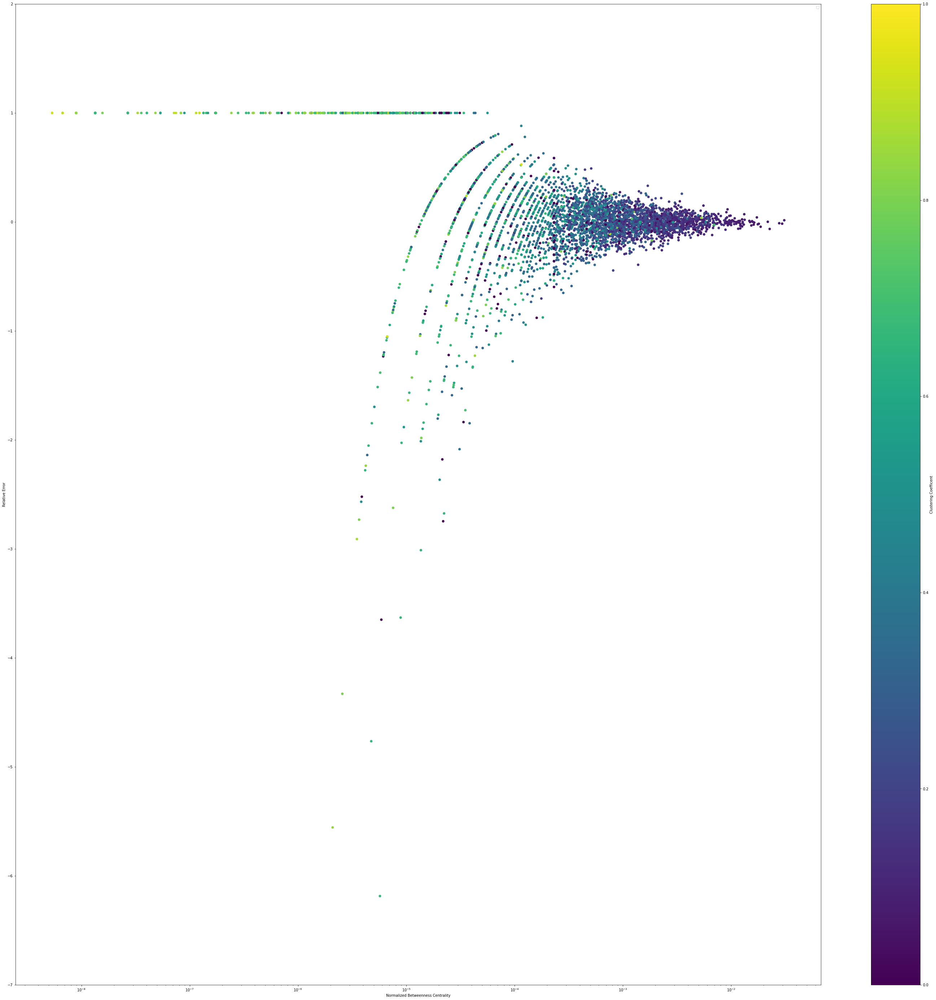

No handles with labels found to put in legend.


<class 'list'> 8638


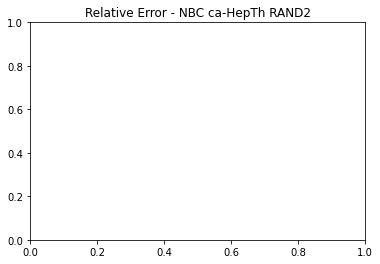

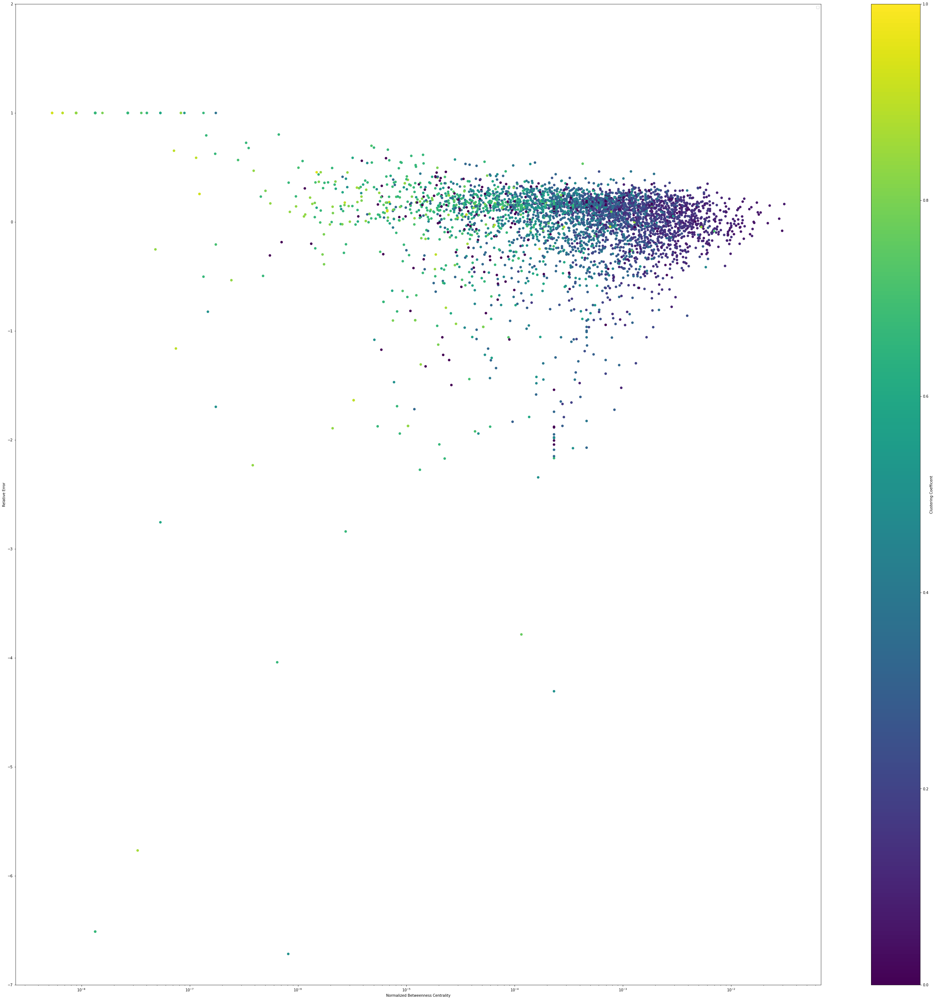

No handles with labels found to put in legend.


<class 'list'> 11204


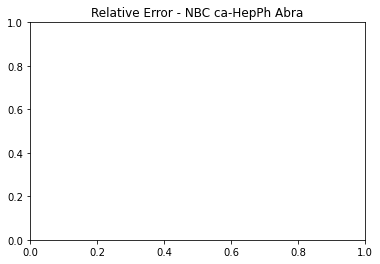

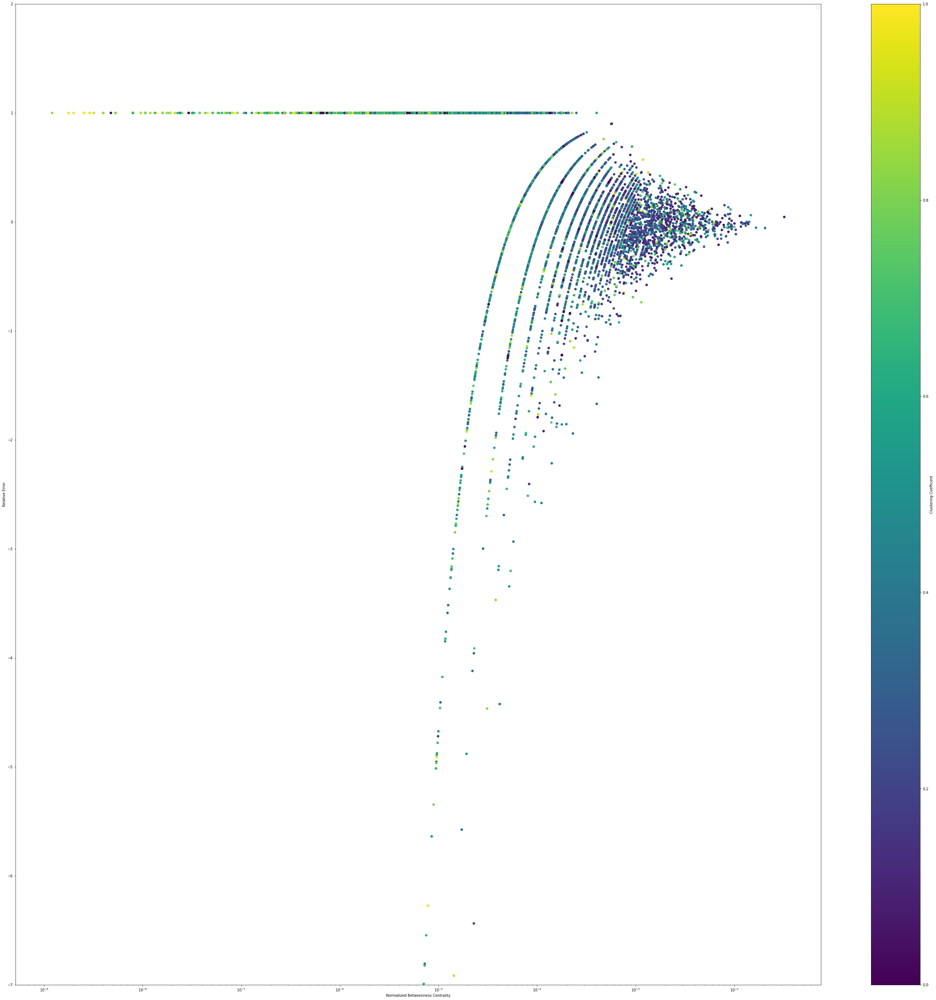

No handles with labels found to put in legend.


<class 'list'> 11204


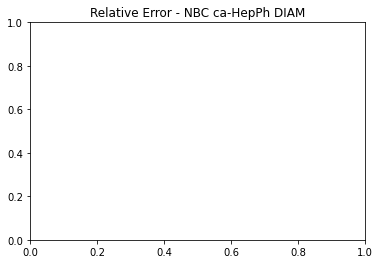

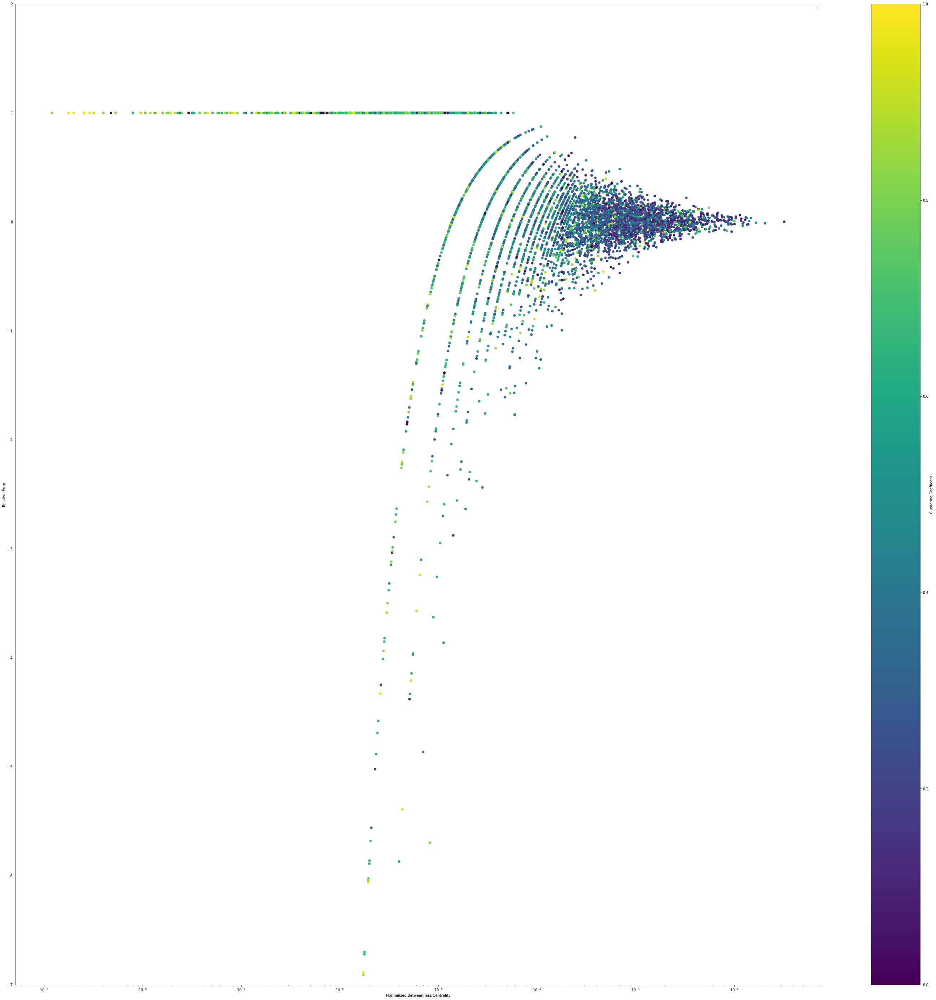

No handles with labels found to put in legend.


<class 'list'> 11204


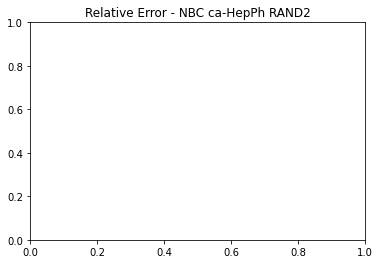

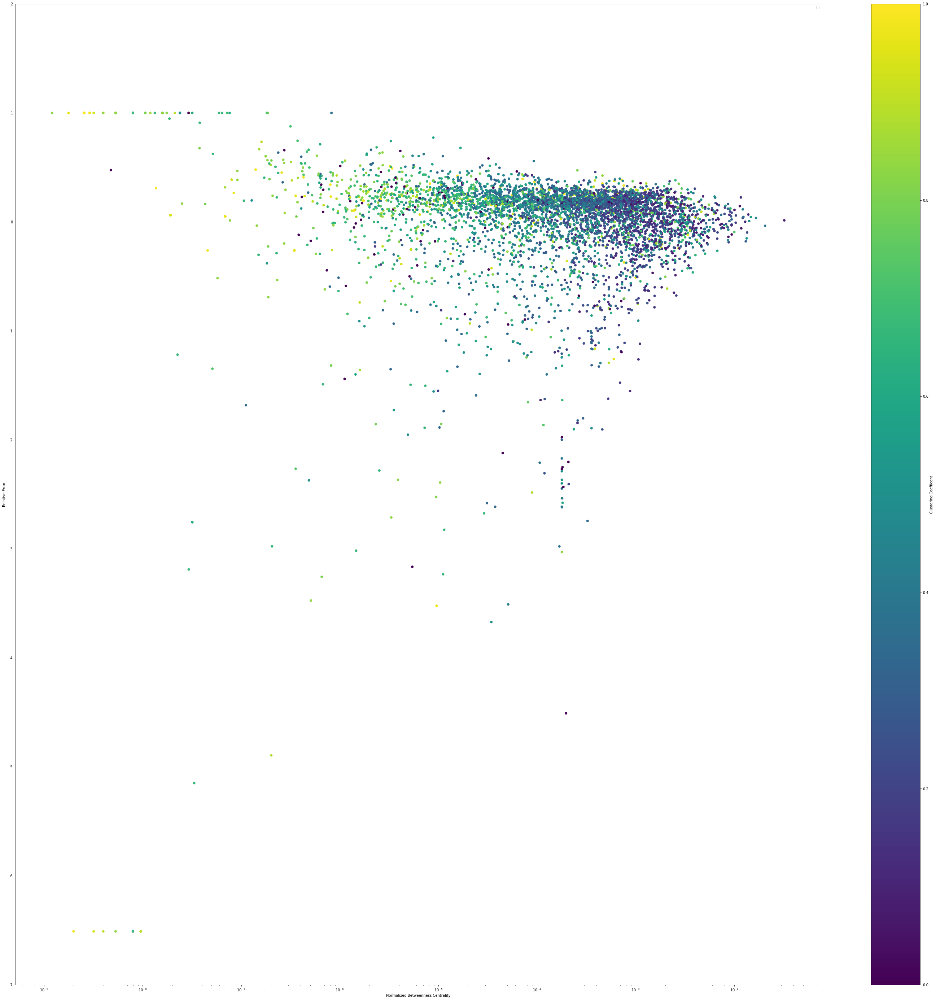

<class 'list'> 334863


No handles with labels found to put in legend.


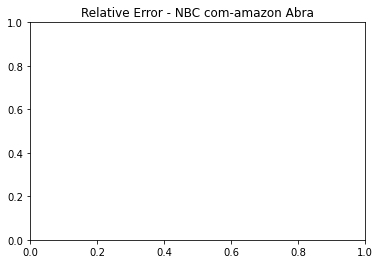

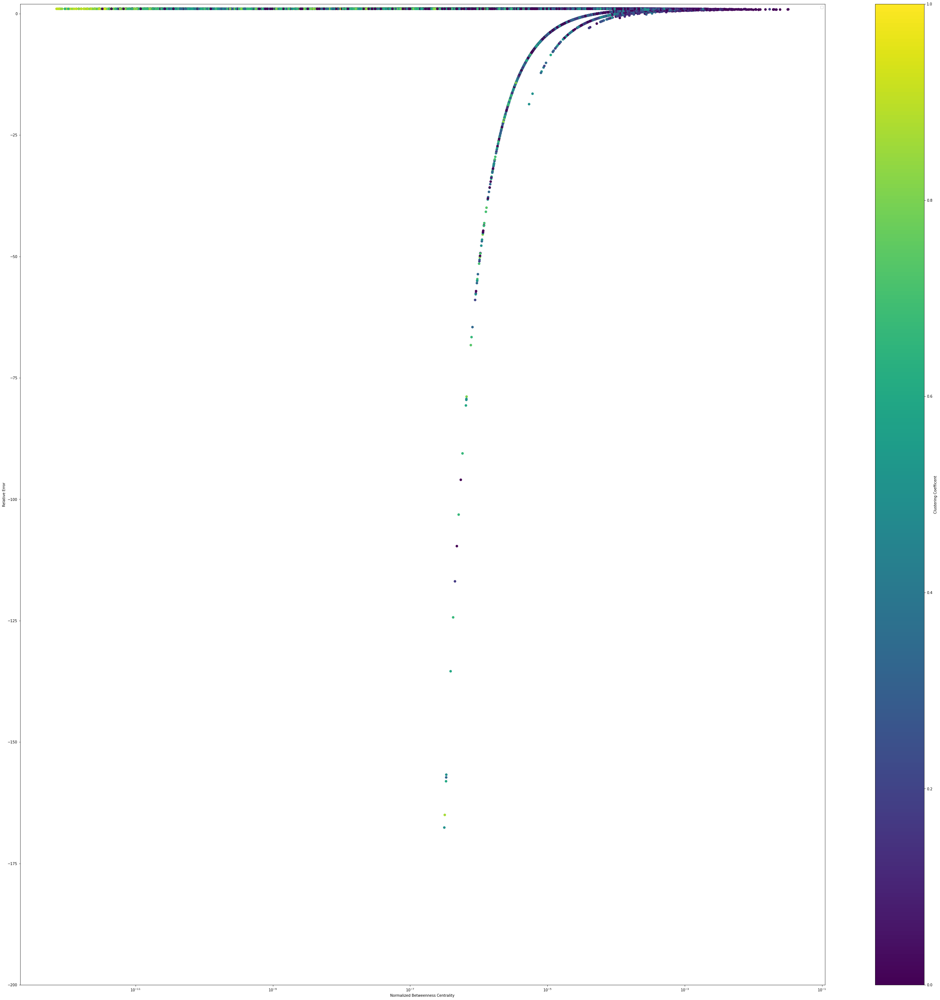

<class 'list'> 334863


No handles with labels found to put in legend.


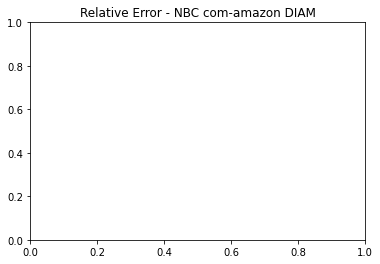

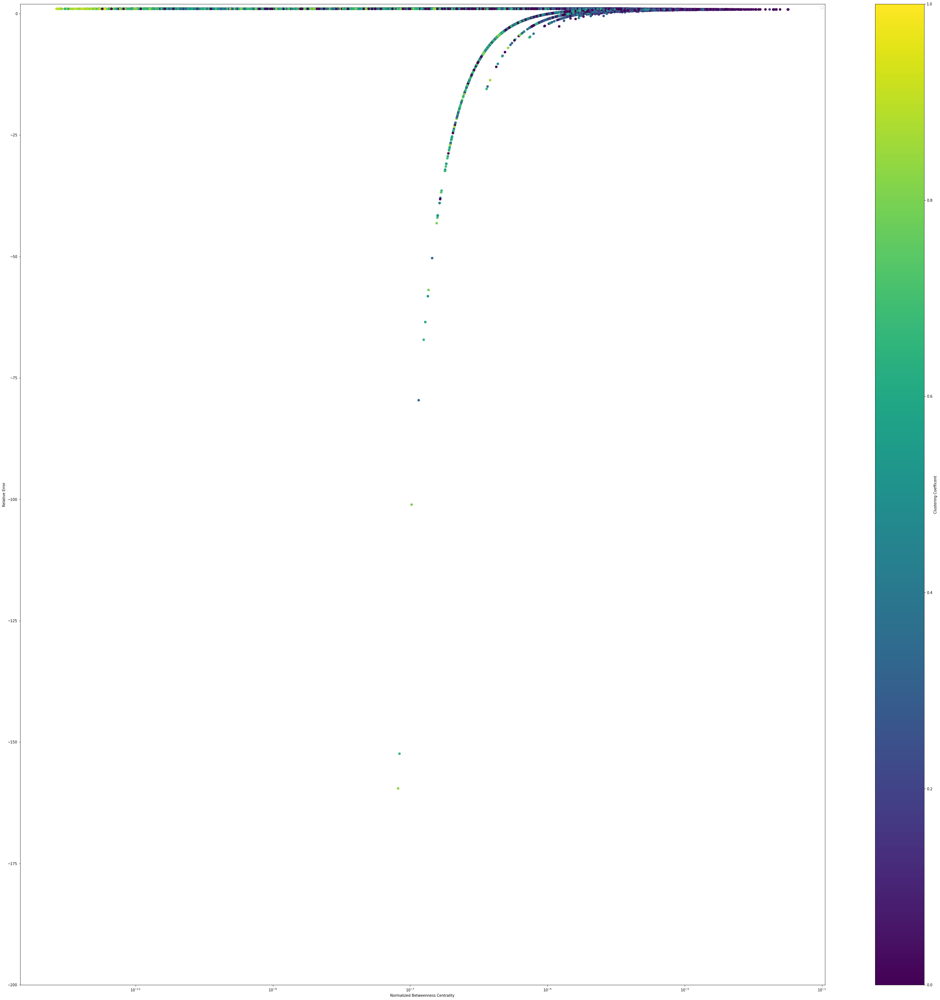

<class 'list'> 334863


No handles with labels found to put in legend.


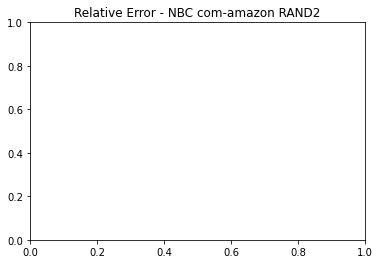

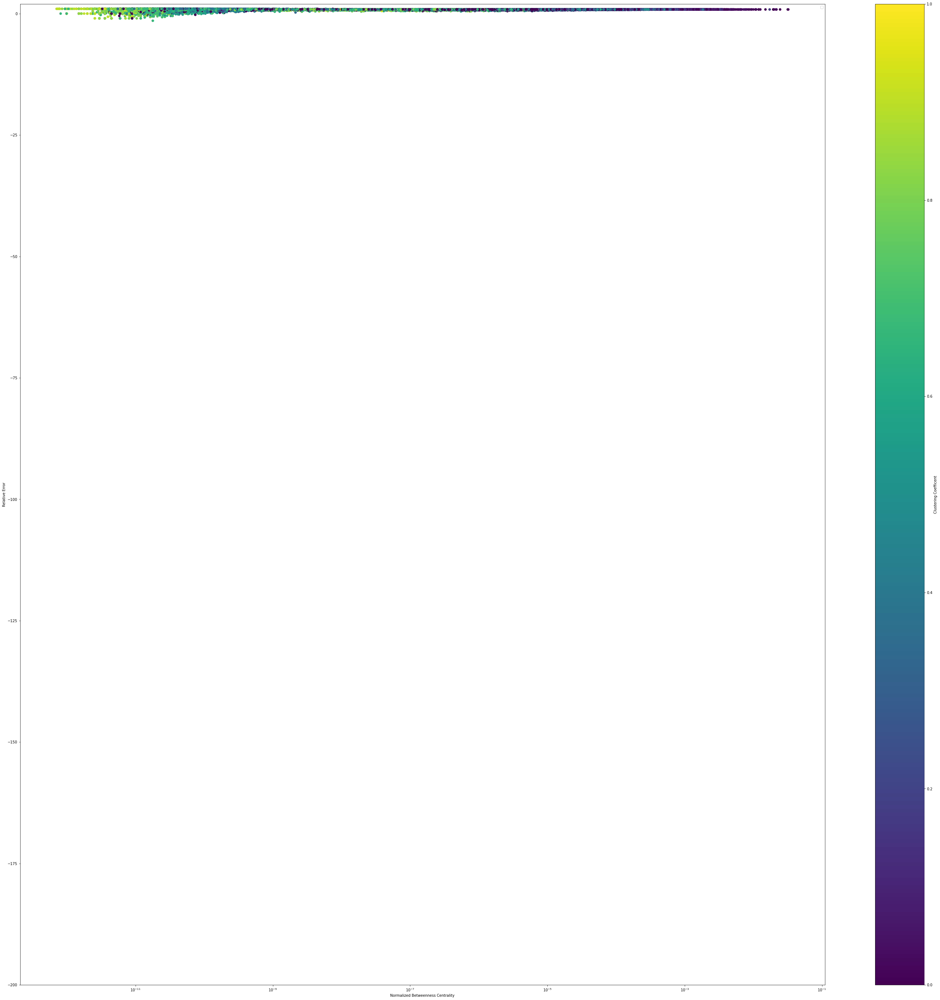

<Figure size 432x288 with 0 Axes>

In [4]:
def plot_relerror_bc_colored():   
    # Limits for Graphs
    #["ca-GrQc", "email-Enron", "ca-HepTh", "ca-HepPh", "com-amazon"]
    upper_limit = [2, 2, 2, 2, 2]
    lower_limit = [-10, -100, -7, -7, -200]
    for index, graph in enumerate(graphs):
        for method in methods:
            # Load error file
            error = IO.file_to_dict(f"{Path().absolute()}\\Errors\\Error_{graph}_{method}.txt")
            G = nx.read_edgelist(f'{Path().absolute()}\\Graphs/{graph}.lcc.net', nodetype=int)
            exact_path = "C:\\Users\\Daniel\\Desktop\\Master Project\\Exact_Betweenness\\Normalized_Scores"
            exact = IO.file_to_dict(f'{exact_path}\\{graph}.txt')
            C = nx.clustering(G)
            all_cval = [C[node] for node in G.nodes]
            print(type(all_cval), len(all_cval))      
            # Plotting Clustering vs Error

            all_bcval = [exact[node] for node in G.nodes]
            all_errorval = [error[node]/exact[node] if exact[node] != 0 else 0 for node in G.nodes]
            # Limits for different Graphs
            plt.title(f'Relative Error - NBC {graph} {method}')
            plt.figure(figsize=(50,50))
            plt.scatter(all_bcval, all_errorval,c=all_cval, cmap='viridis')
            plt.xscale('log')
            plt.legend()
            plt.colorbar(label='Clustering Coefficent')
            plt.ylim([lower_limit[index], upper_limit[index]])
            plt.xlabel('Normalized Betweenness Centrality')
            plt.ylabel('Relative Error')
            plt.savefig(f'Plots\\Betweenness Centrality\\Relative Error\\colored clustering\\BC-Rel_Error_{graph}_{method}_colored_clustering.png')
            plt.show()
            plt.clf()
plot_relerror_bc_colored()

No handles with labels found to put in legend.


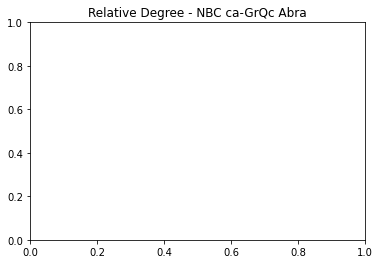

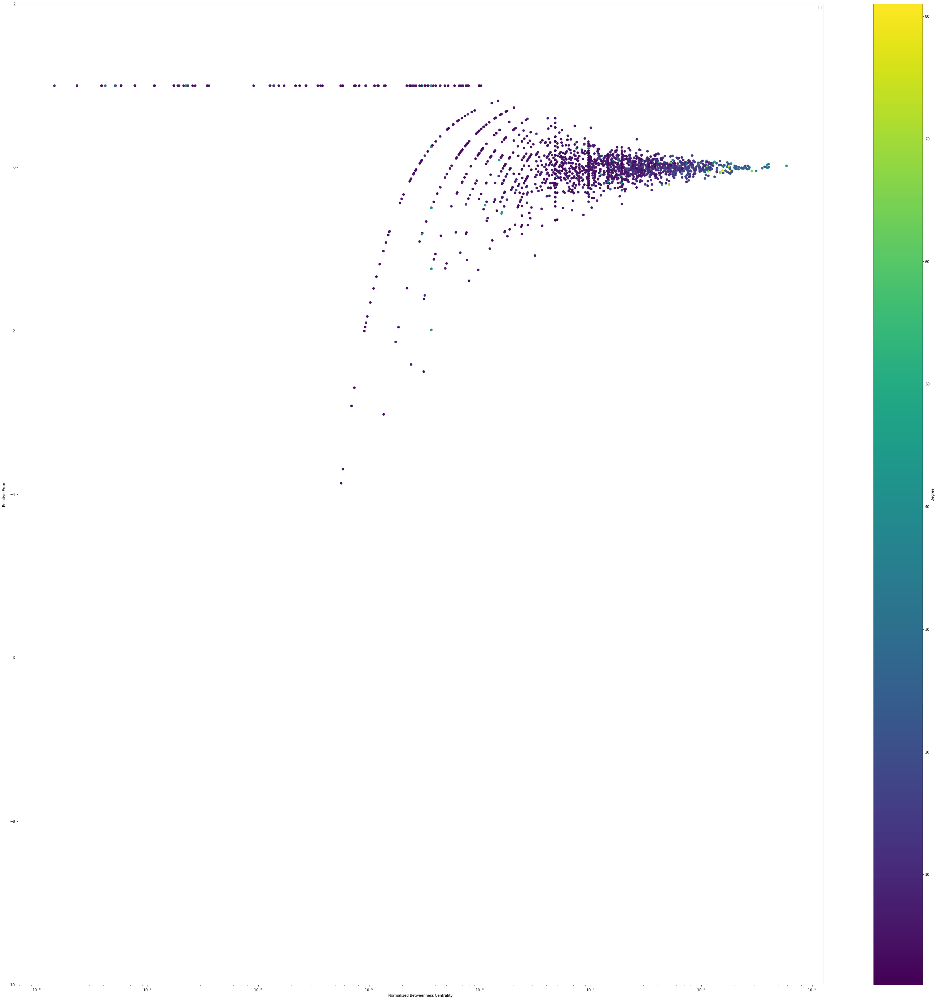

No handles with labels found to put in legend.


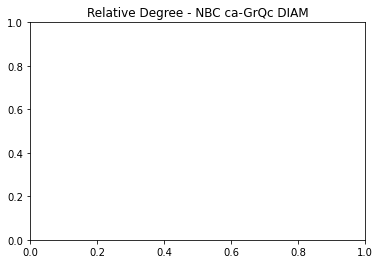

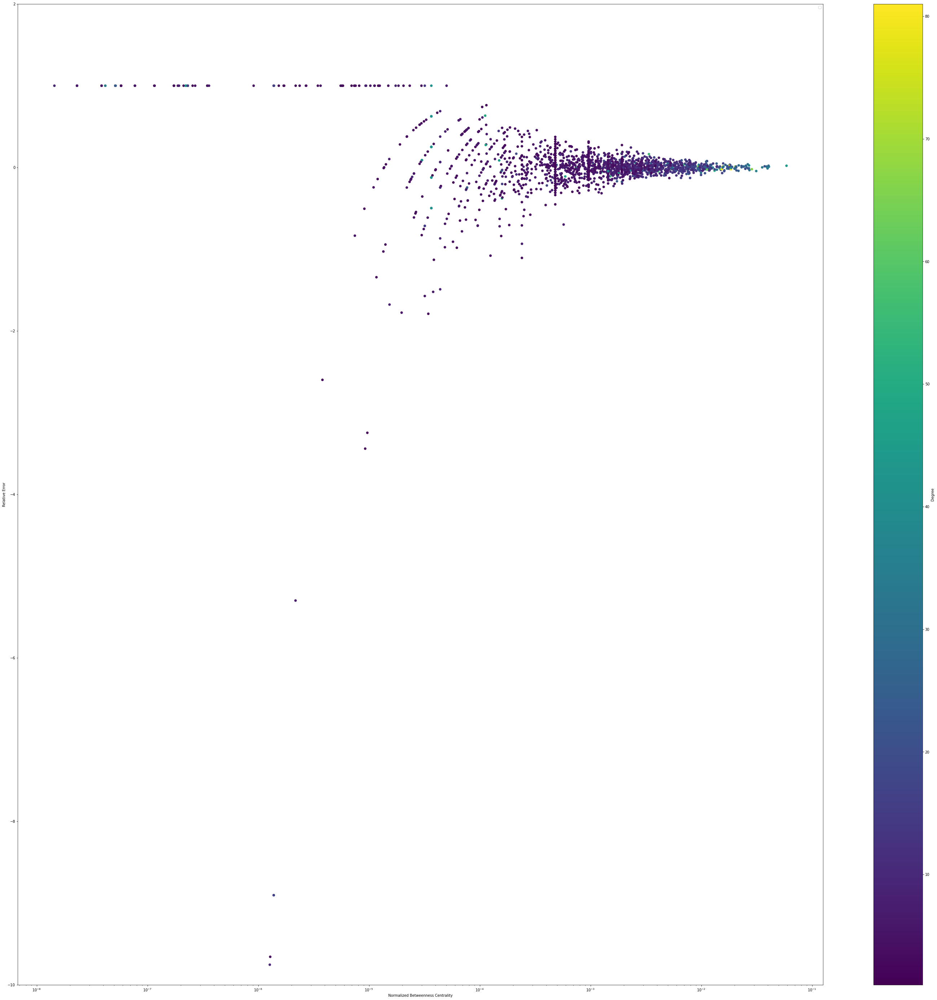

No handles with labels found to put in legend.


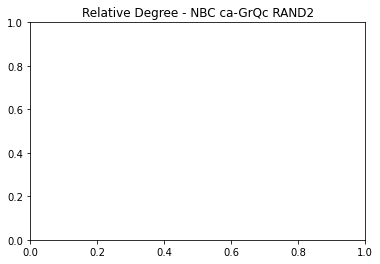

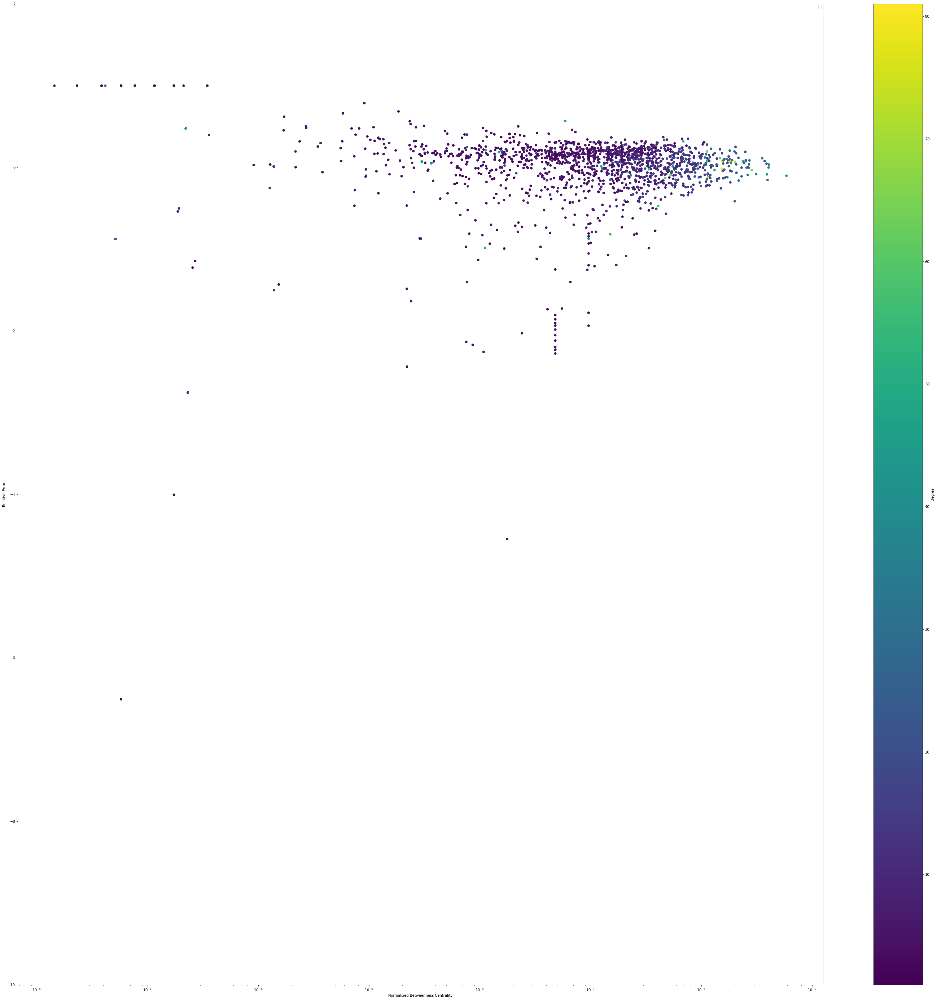

No handles with labels found to put in legend.


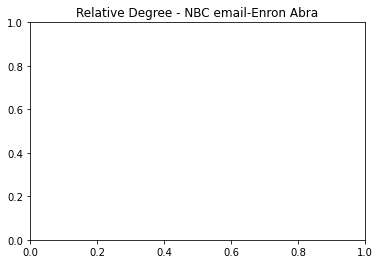

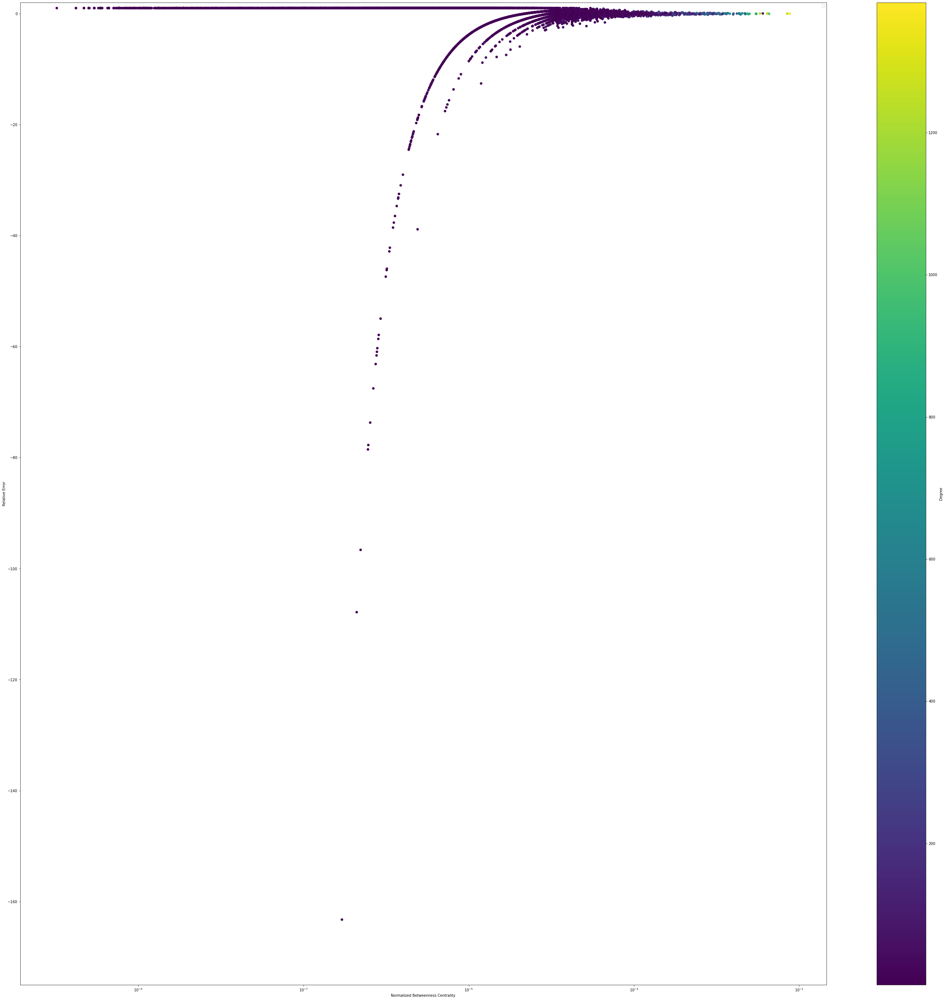

No handles with labels found to put in legend.


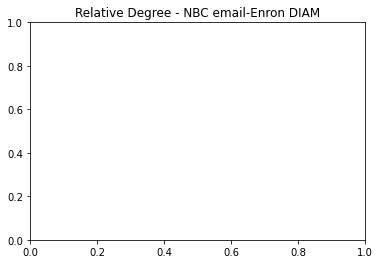

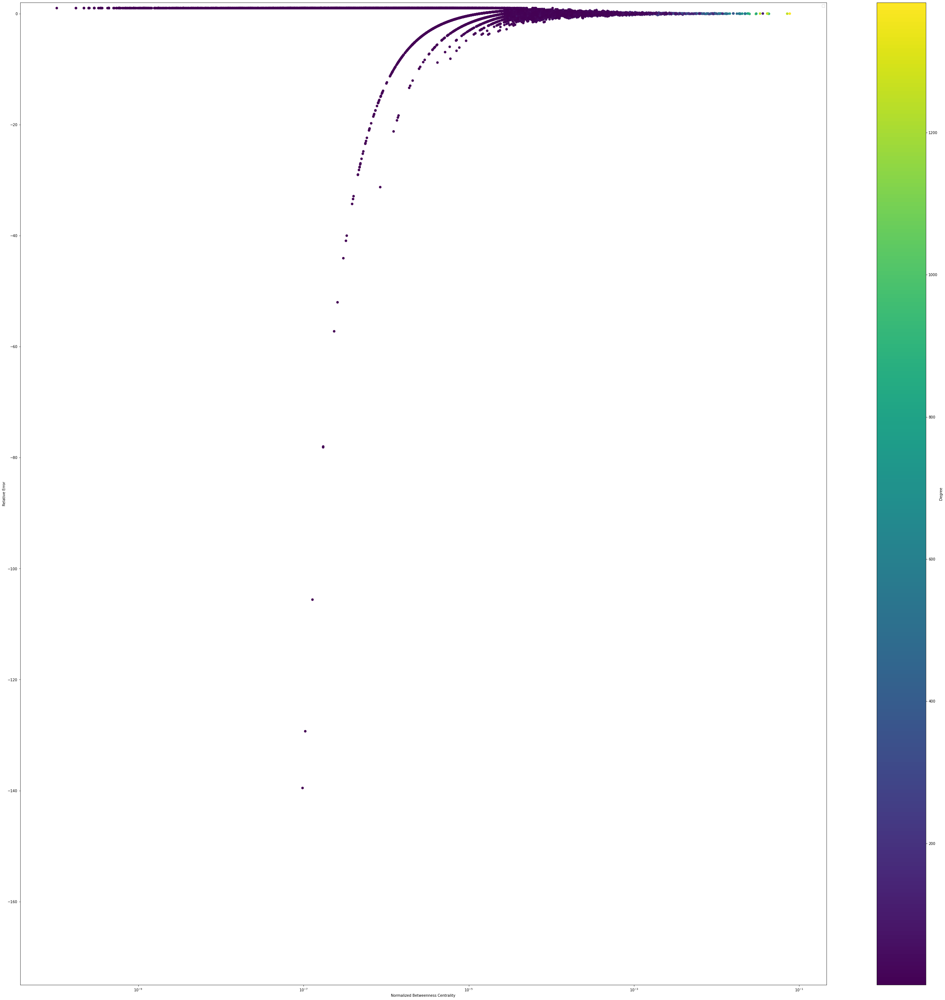

No handles with labels found to put in legend.


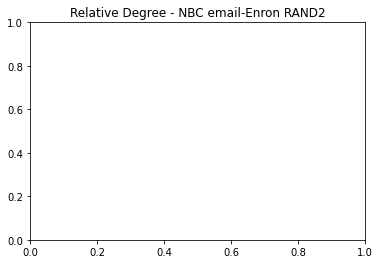

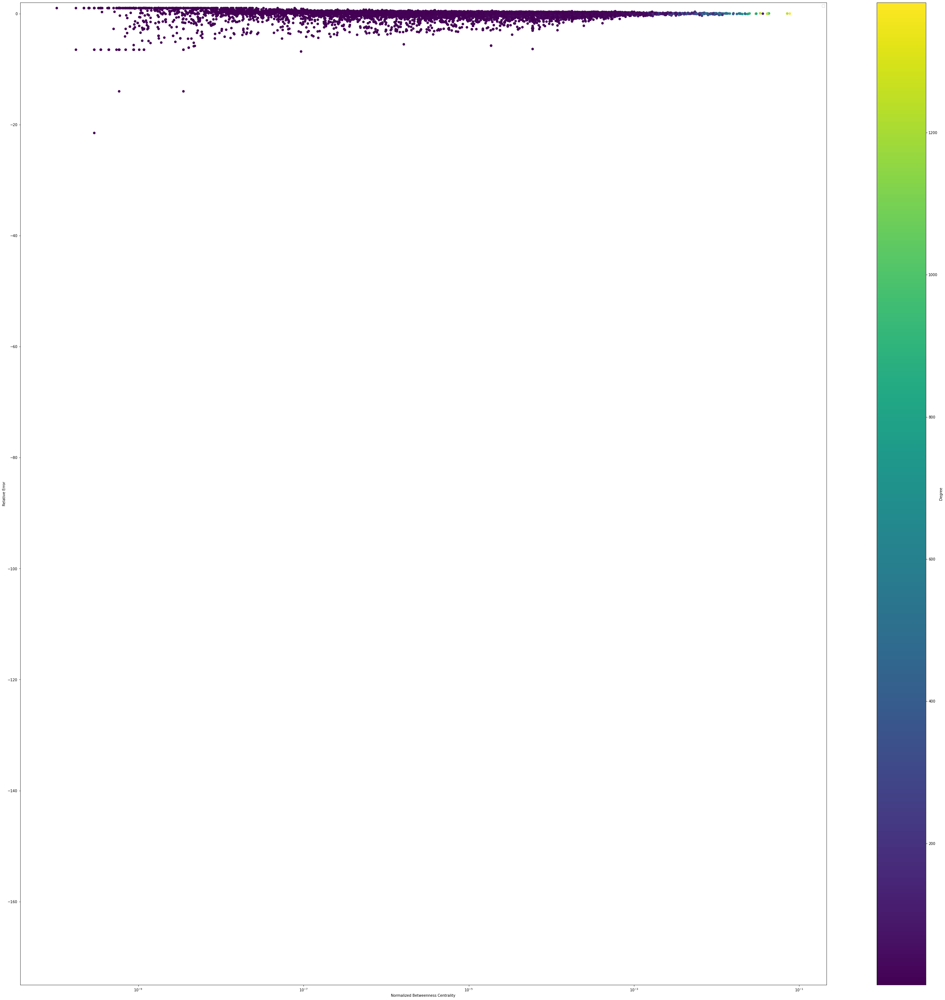

No handles with labels found to put in legend.


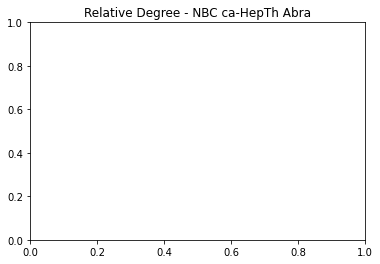

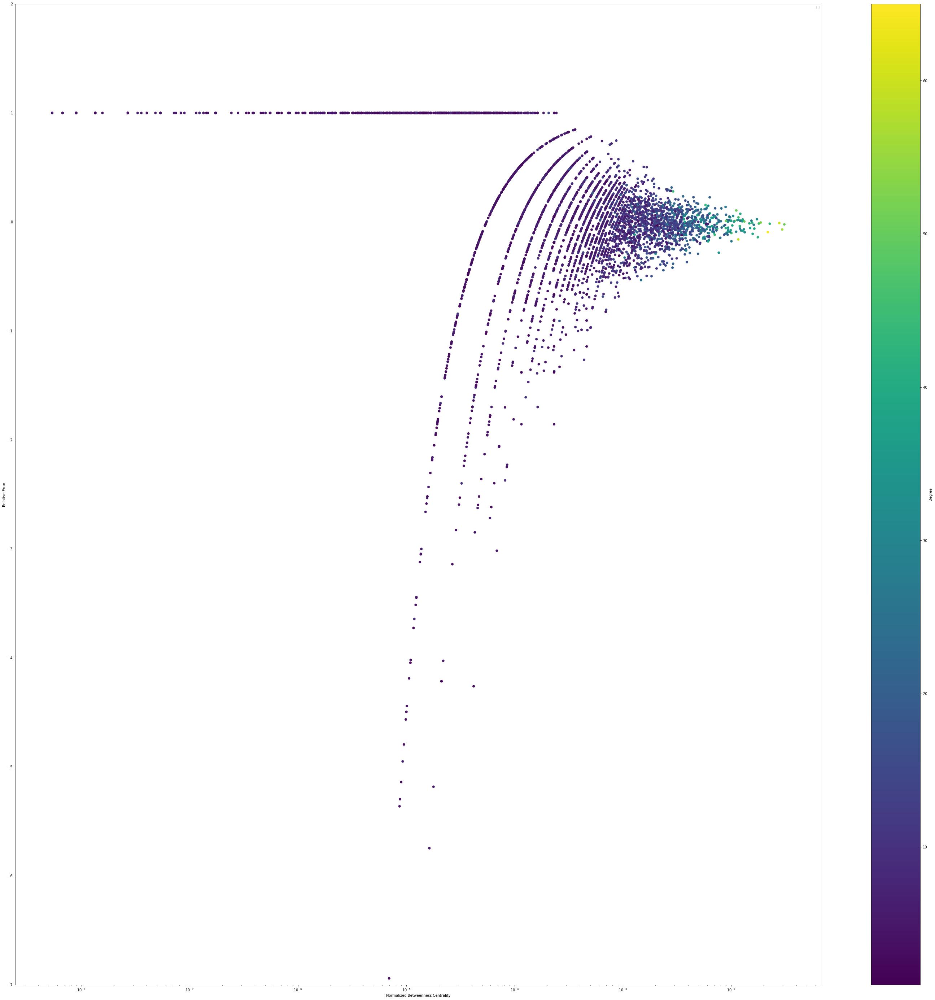

No handles with labels found to put in legend.


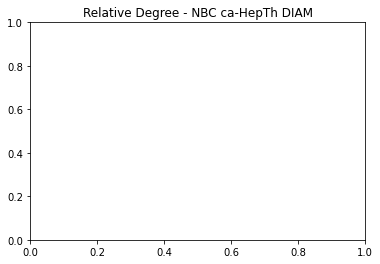

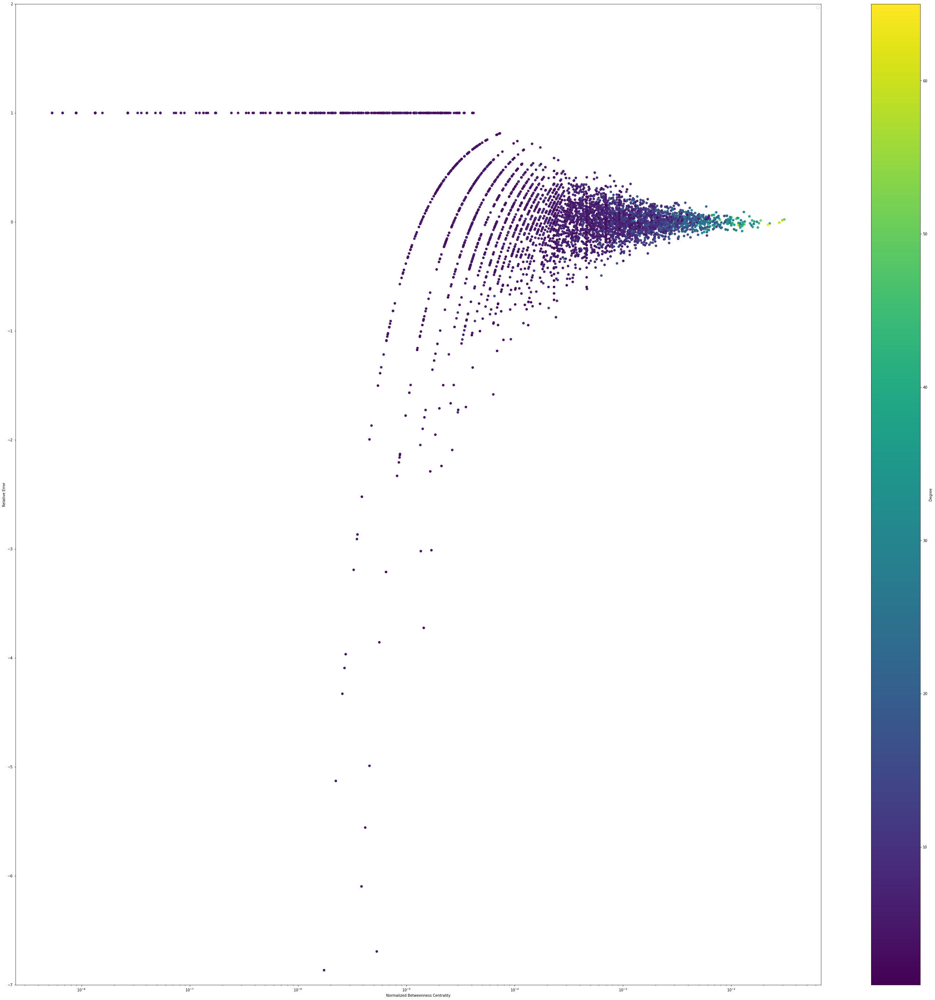

No handles with labels found to put in legend.


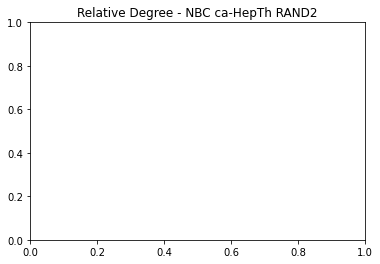

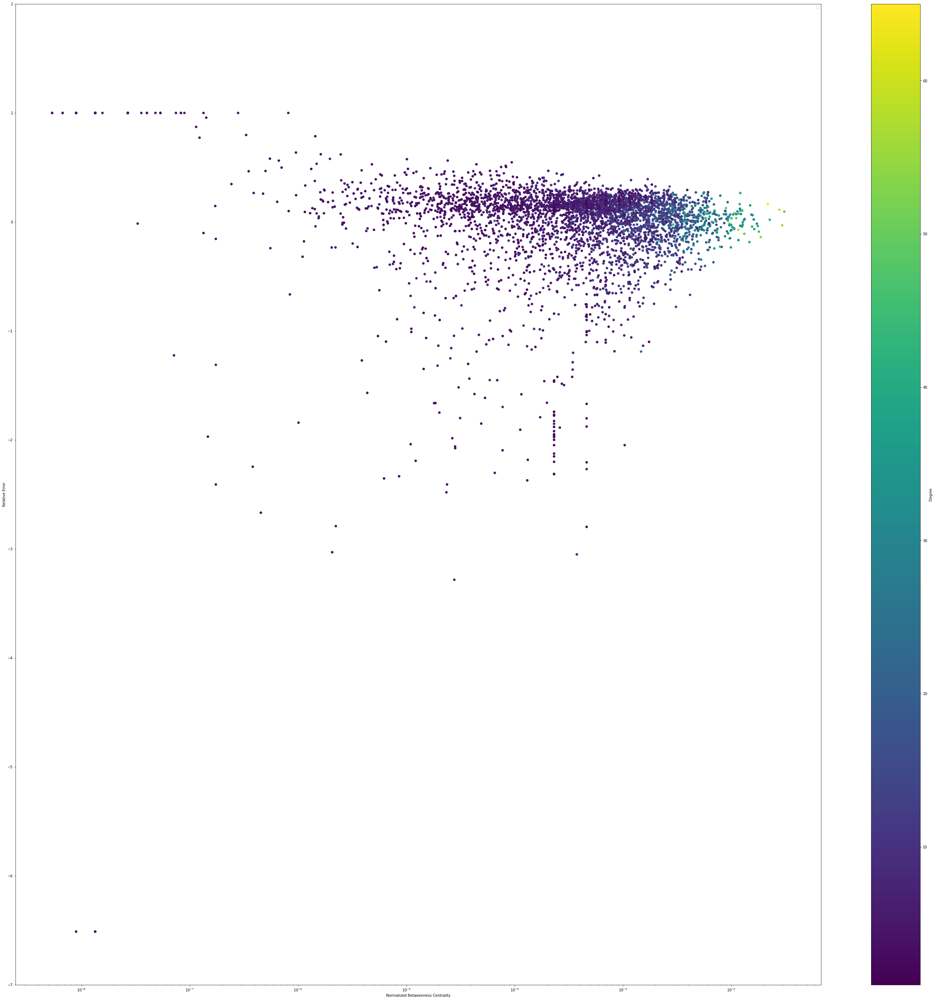

No handles with labels found to put in legend.


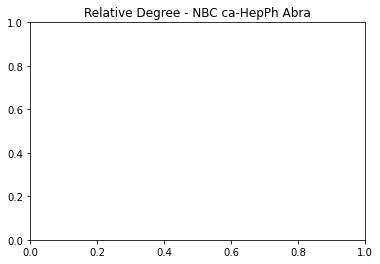

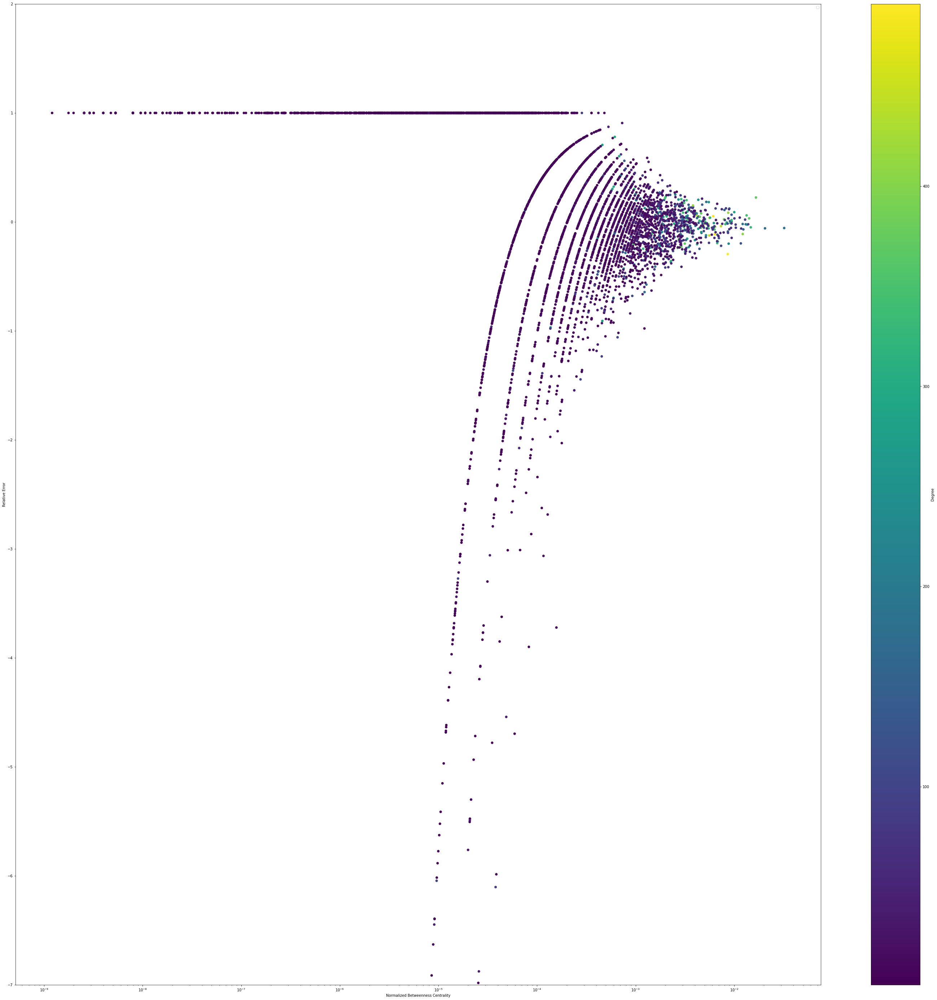

No handles with labels found to put in legend.


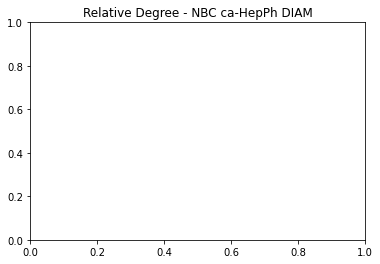

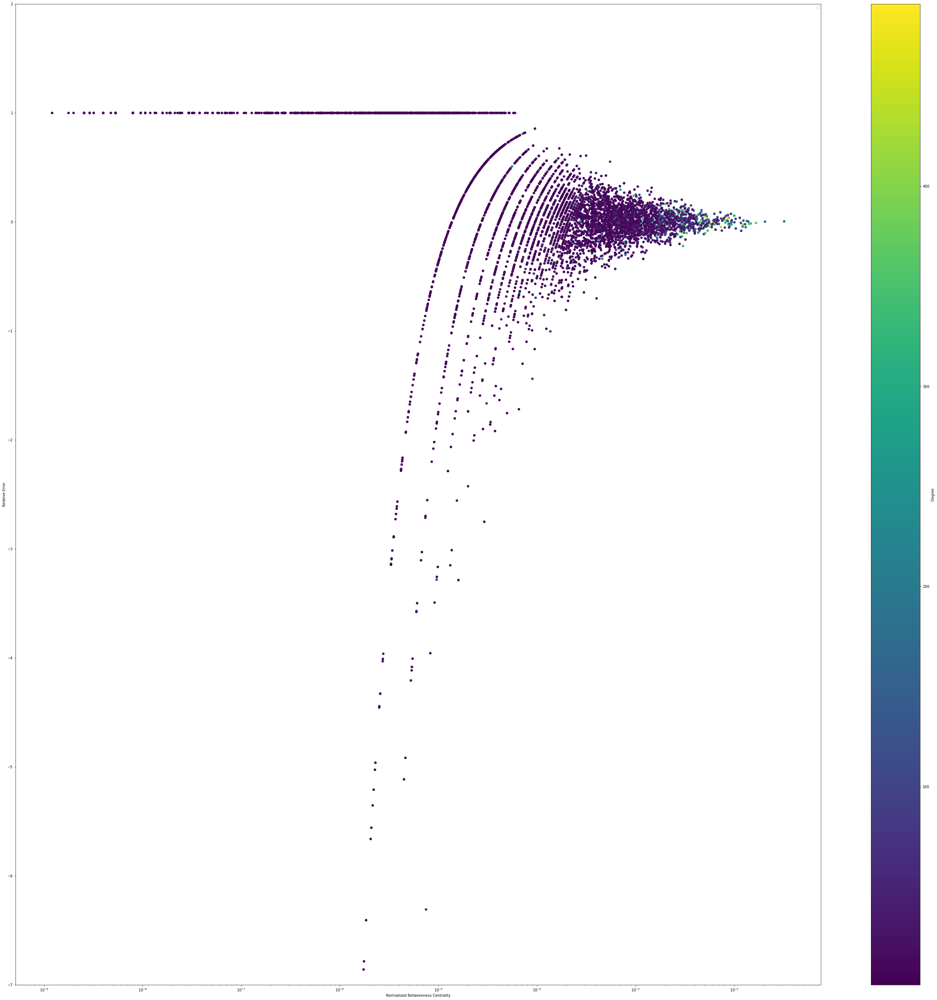

No handles with labels found to put in legend.


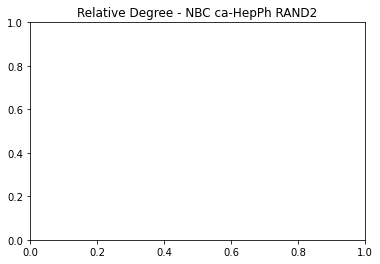

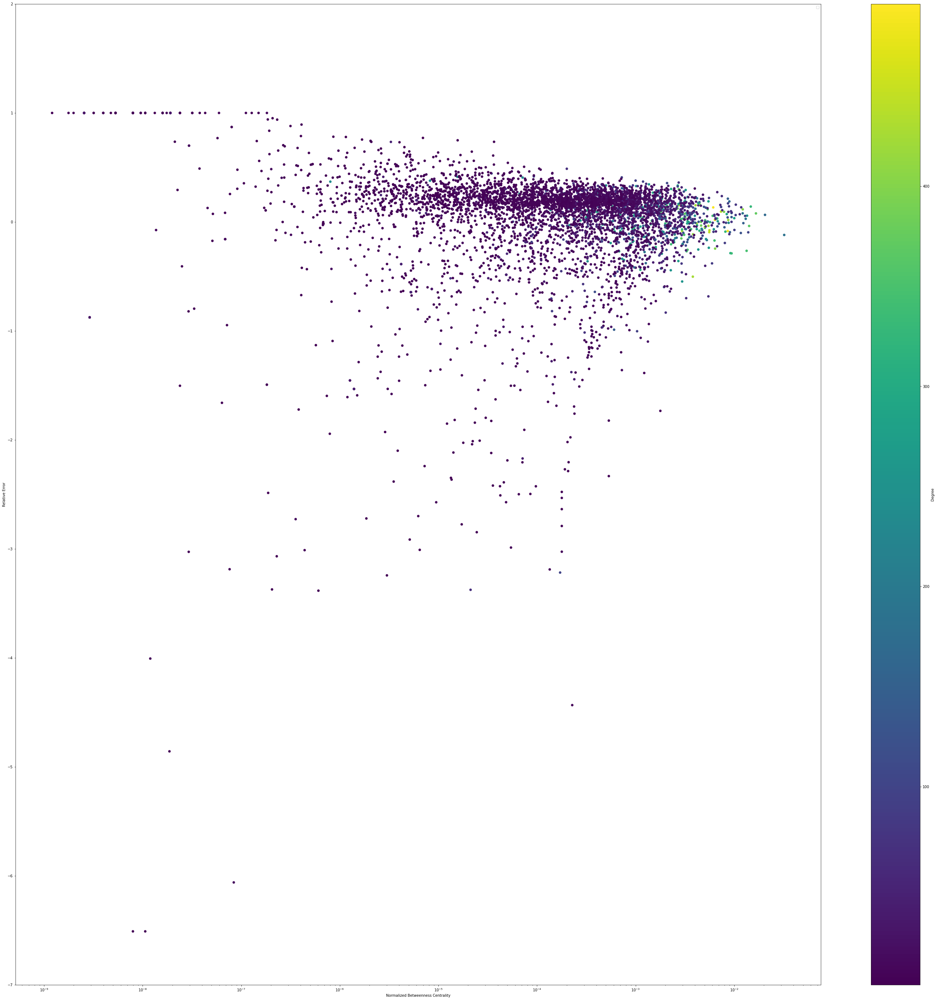

No handles with labels found to put in legend.


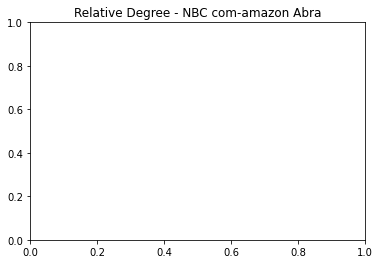

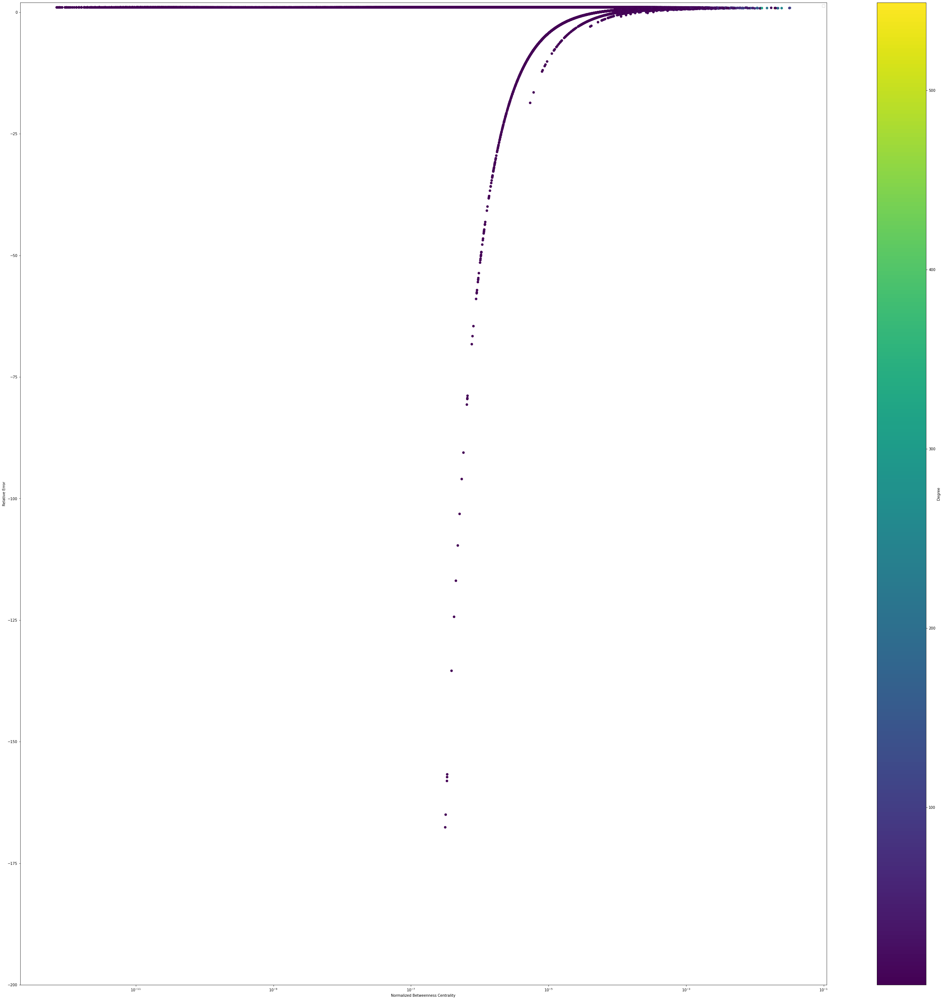

No handles with labels found to put in legend.


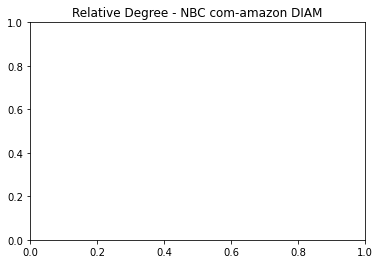

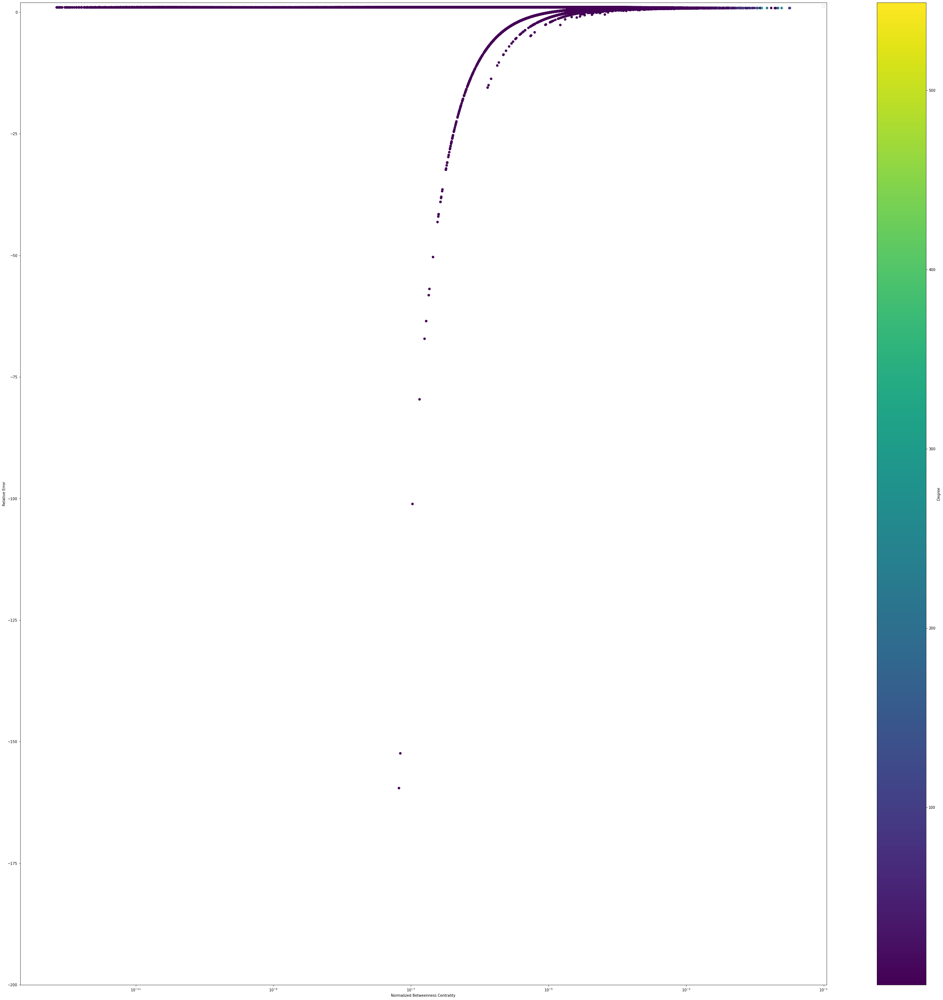

No handles with labels found to put in legend.


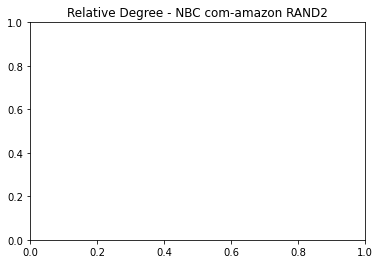

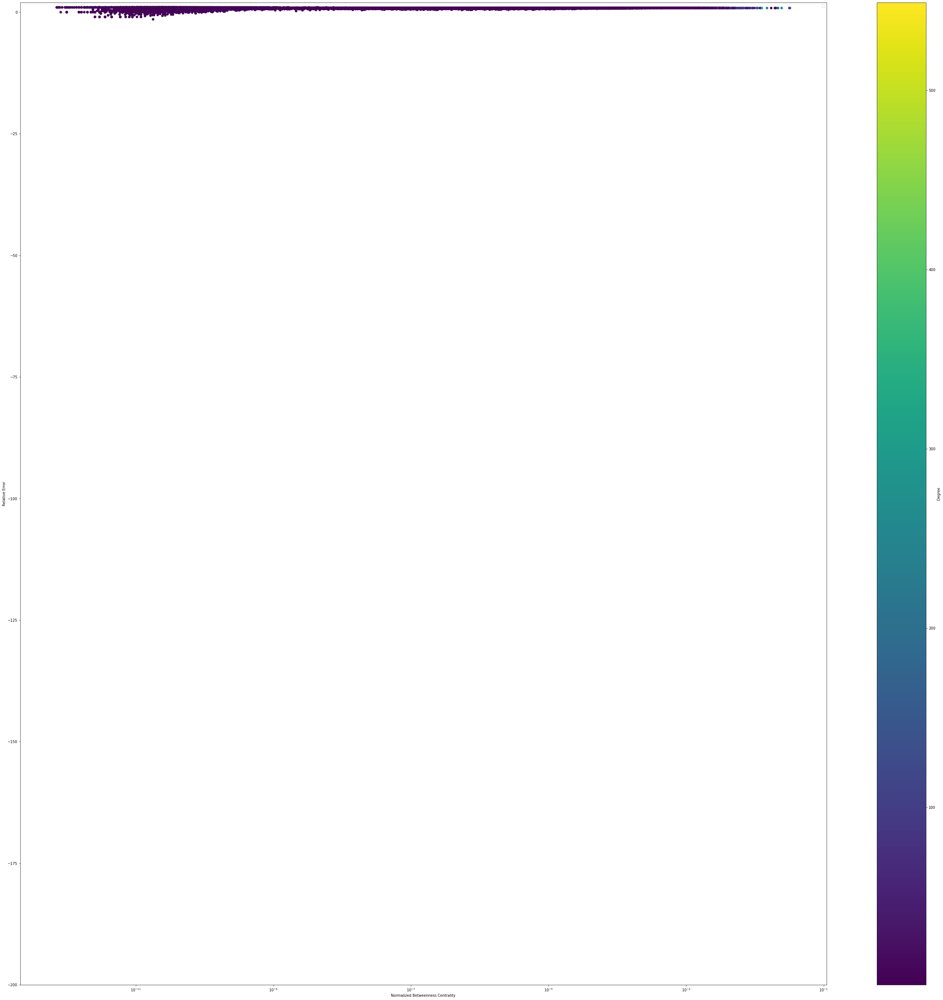

<Figure size 432x288 with 0 Axes>

In [6]:
def plot_relerror_bc_colored_Degree():   
    # Limits for Graphs
    #["ca-GrQc", "email-Enron", "ca-HepTh", "ca-HepPh", "com-amazon"]
    upper_limit = [2, 2, 2, 2, 2]
    lower_limit = [-10, -175, -7, -7, -200]
    for index, graph in enumerate(graphs):
        for method in methods:
            # Load error file
            error = IO.file_to_dict(f"{Path().absolute()}\\Errors\\Error_{graph}_{method}.txt")
            G = nx.read_edgelist(f'{Path().absolute()}\\Graphs/{graph}.lcc.net', nodetype=int)
            exact_path = "C:\\Users\\Daniel\\Desktop\\Master Project\\Exact_Betweenness\\Normalized_Scores"
            exact = IO.file_to_dict(f'{exact_path}\\{graph}.txt')
            
            all_dval = [G.degree[node] for node in G.nodes]
                        
            # Plotting Clustering vs Error

            all_bcval = [exact[node] for node in G.nodes]
            all_errorval = [error[node]/exact[node] if exact[node] != 0 else 0 for node in G.nodes]
            # Limits for different Graphs
            plt.title(f'Relative Degree - NBC {graph} {method}')
            plt.figure(figsize=(50,50))
            plt.scatter(all_bcval, all_errorval,c=all_dval, cmap='viridis')
            plt.xscale('log')
            plt.legend()
            plt.colorbar(label='Degree')
            plt.ylim([lower_limit[index], upper_limit[index]])
            plt.xlabel('Normalized Betweenness Centrality')
            plt.ylabel('Relative Error')
            plt.savefig(f'Plots\\Betweenness Centrality\\Relative Error\\colored degree\\BC-Rel_Error_{graph}_{method}_colored_degree.png')
            plt.show()
            plt.clf()
plot_relerror_bc_colored_Degree()